In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!pip install lime shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=544ef48eb549c3b25af1e253827ab57bafd6bd35e53dbbde6d37a349c225e42e
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
!pip install praw
import praw

In [ ]:
!pip install nlpaug transformers
import nlpaug.augmenter.word as naw

In [2]:
!pip install fasttext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 3.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pybind11-2.13.6-py3-none-any.whl.metadata (9.5 kB)
Using cached pybind11-2.13.6-py3-none-any.whl (243 kB)
  Created wheel for fasttext: filename=fasttext-0.9.3-cp311-cp311-linux_x86_64.whl size=4313502 sha256=55150a22620cf8128c0f630ad4612e5a2ce49c1a6e9252eebd3aa6766bbc9639
  Stored in directory: /root/.cache/pip/wheels/65/4f/35/5057db0249224e9ab55a513fa6b79451473ceb7713017823c3
Successfully built fasttext


In [1]:
!pip install gensim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 85.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 111.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 14.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.3
    Uninstalling scipy-1.15.3:
      Successfully uninstalled scipy-1.15.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incompatible.
thinc 8.3.6 re

In [2]:
import pandas as pd
import numpy as np
import nltk
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from gensim.models import FastText
from sklearn.naive_bayes import MultinomialNB
from gensim.models import KeyedVectors
# import fasttext.util
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
# import graphviz
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
# from google.colab import userdata
import random
from collections import Counter
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import GridSearchCV

In [5]:
pd.set_option('display.max_colwidth', None)  # Disable column width limit (show full text)


# Getting Data from Reddit

In [ ]:
CLIENT_ID = userdata.get('REDDIT_CLIENT_ID')
CLIENT_SECRET = userdata.get('REDDIT_CLIENT_SECRET')
USER_AGENT = userdata.get('REDDIT_USER_AGENT')

reddit = praw.Reddit(
    client_id=CLIENT_ID,
    client_secret=CLIENT_SECRET,
    user_agent=USER_AGENT
)

# Set up Reddit API klien
reddit = praw.Reddit(
    client_id=CLIENT_ID,
    client_secret=CLIENT_SECRET,
    user_agent=USER_AGENT
)

# List dari subreddit yg ingin di fetch
subreddits = ['AskReddit', 'funny', 'memes', 'teenagers', 'OutOfTheLoop', 'soccer', 'gaming', 'NoStupidQuestions']
total_posts_needed = 6500  # Total number of posts to fetch
posts_per_subreddit = total_posts_needed // len(subreddits)  # Fetch evenly from each subreddit

data = []

# Fetch post dari setiap subreddit
for subreddit_name in subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    count = 0
    for submission in subreddit.hot(limit=posts_per_subreddit):
        try:
            title = submission.title
            text = submission.selftext
            upvotes = submission.score
            comments_count = submission.num_comments
            timestamp = submission.created_utc
            subreddit_name = submission.subreddit.display_name

            # Mengambil comments
            comments_data = []
            submission.comments.replace_more(limit=0)
            for comment in submission.comments.list():
                comment_text = comment.body
                comment_upvotes = comment.score
                comment_timestamp = comment.created_utc
                comments_data.append([comment_text, comment_upvotes, comment_timestamp])

            # Tambahkan post data
            data.append([title, text, upvotes, comments_count, timestamp, subreddit_name, comments_data])

            count += 1
            if count >= posts_per_subreddit:
                break

        except TooManyRequests as e:
            print("Rate limit hit. Sleeping for 60 seconds...")
            time.sleep(60)  # Sleep selama 60 seconds sebelum mencoba lagi
            continue

        # Optional: Sleep untuk beberapa detik untuk mengurangi terkena rate limit
        time.sleep(2)

df = pd.DataFrame(data, columns=['Title', 'Text', 'Upvotes', 'Comments', 'Timestamp', 'Subreddit', 'Comments Data'])

# Save ke csv
df.to_csv('reddit_data_with_comments.csv', index=False)

print(df.head())


In [ ]:
import pandas as pd
import ast
from datetime import datetime, timezone

# Membaca file CSV
df = pd.read_csv('reddit_data_with_comments.csv')  # Gantilah 'Original Data.csv' dengan path file yang sesuai

# Membuat DataFrame
post_data = pd.DataFrame(df)

# Langkah 1: Menggabungkan Judul, Teks, dan Data Komentar ke dalam baris terpisah

# Mengonversi Data Komentar dari format string menjadi list
post_data['Comments Data'] = post_data['Comments Data'].apply(ast.literal_eval)

# Menyiapkan DataFrame untuk ekspansi ke banyak baris
expanded_data = []

# Menambahkan Judul dan Teks sebagai baris terpisah
for _, row in post_data.iterrows():
    # Menambahkan judul sebagai baris
    expanded_data.append({'Text': row['Title'], 'Category': 'No Slang', 'Date': datetime.fromtimestamp(row['Timestamp'], tz=timezone.utc).strftime('%Y-%m-%d %H:%M:%S'), 'Upvotes': row['Upvotes'], 'Subreddit': row['Subreddit']})

    # Menambahkan teks (jika tersedia)
    if row['Text']:
        expanded_data.append({'Text': row['Text'], 'Category': 'No Slang', 'Date': datetime.fromtimestamp(row['Timestamp'], tz=timezone.utc).strftime('%Y-%m-%d %H:%M:%S'), 'Upvotes': row['Upvotes'], 'Subreddit': row['Subreddit']})

    # Menambahkan setiap komentar sebagai baris terpisah
    for comment in row['Comments Data']:
        expanded_data.append({'Text': comment[0], 'Category': 'No Slang', 'Date': datetime.fromtimestamp(comment[2], tz=timezone.utc).strftime('%Y-%m-%d %H:%M:%S'), 'Upvotes': comment[1], 'Subreddit': row['Subreddit']})

# Membuat DataFrame yang telah diperluas
expanded_df = pd.DataFrame(expanded_data)

# Menyimpan data yang telah dibersihkan ke file CSV baru
expanded_df.to_csv('Original Data.csv', index=False)  # Menyimpan data ke file baru

# Menampilkan DataFrame yang telah diperluas
print(expanded_df)


## Sampling and Target data selection

In [ ]:
import pandas as pd
# Load CSV
file_path = "/content/Original Data.csv"
df = pd.read_csv(file_path)

# Menampilkan informasi basic dan 5 baris pertama
df_info = df.info()
df_head = df.head()

df_info, df_head

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6500 entries, 0 to 6499
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Text       6458 non-null   object
 1   Date       6500 non-null   object
 2   Upvotes    6500 non-null   int64 
 3   Subreddit  6500 non-null   object
 4   Category   6500 non-null   object
dtypes: int64(1), object(4)
memory usage: 254.0+ KB


(None,
                                                 Text                 Date  \
 0  This man is a cut above the rest, outdoor or i...  2025-03-18 12:36:49   
 1                                      Why not four?  2025-03-15 16:30:40   
 2                                          MAGA baby  2025-03-18 04:43:41   
 3  I doubt even ChatGPT would come up with a stor...  2025-03-18 12:48:15   
 4  I feel that's kinda true but at the same time ...  2025-03-18 12:43:17   
 
    Upvotes  Subreddit         Category  
 0        1     soccer         No Slang  
 1        5      funny         No Slang  
 2        1  AskReddit  Offensive Slang  
 3       87     gaming         No Slang  
 4        1     soccer         No Slang  )

In [ ]:
df_sample = df.sample(n=10, random_state=42)
df_sample

,Text,Date,Upvotes,Subreddit,Category
3106,It feels warm and safe.,2025-03-18 17:22:26,1,AskReddit,No Slang
6161,"But you understand what Vance meant by ""haven'...",2025-03-08 04:27:29,52,OutOfTheLoop,No Slang
1867,I'm glad to hear that.,2025-03-15 15:26:35,1,gaming,No Slang
3238,Today's news,2025-03-18 08:42:15,0,AskReddit,No Slang
5509,lol if i criticize anything in this post someo...,2025-03-18 05:12:55,1,memes,Internet Slang
6167,I got too old to believe in fairy tales,2025-03-17 03:10:06,27,AskReddit,No Slang
2142,Men. Y’all are whole predators and refuse to a...,2025-03-18 15:44:43,1,AskReddit,Casual Slang
2457,....and he's off again,2025-03-17 12:48:56,4,soccer,No Slang
6047,I had a girlfriend that just up and ghosted me...,2025-03-18 09:36:26,52,AskReddit,Offensive Slang
3244,"Yeah, I enjoy playing as a Turtle, building up...",2025-03-18 11:18:08,44,gaming,Internet Slang


In [ ]:
df[["Text","Category"]].to_csv('TargetData.csv', index=False)

# EDA

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string
import re
import nltk

from tqdm import trange
from nltk import tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
import pandas as pd
# Load CSV
file_path = "/content/TargetData.csv"
df = pd.read_csv(file_path)

# Menampilkan informasi basic dan 5 baris pertama
df_info = df.info()
df_head = df.head()

df_info, df_head

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6500 entries, 0 to 6499
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Text      6458 non-null   object
 1   Category  6500 non-null   object
dtypes: object(2)
memory usage: 101.7+ KB


(None,
                                                 Text         Category
 0  This man is a cut above the rest, outdoor or i...         No Slang
 1                                      Why not four?         No Slang
 2                                          MAGA baby  Offensive Slang
 3  I doubt even ChatGPT would come up with a stor...         No Slang
 4  I feel that's kinda true but at the same time ...         No Slang)

In [ ]:
df_sample = df.sample(n=10, random_state=42)
df_sample

,Text,Category
3106,It feels warm and safe.,No Slang
6161,"But you understand what Vance meant by ""haven'...",No Slang
1867,I'm glad to hear that.,No Slang
3238,Today's news,No Slang
5509,lol if i criticize anything in this post someo...,Internet Slang
6167,I got too old to believe in fairy tales,No Slang
2142,Men. Y’all are whole predators and refuse to a...,Casual Slang
2457,....and he's off again,No Slang
6047,I had a girlfriend that just up and ghosted me...,Offensive Slang
3244,"Yeah, I enjoy playing as a Turtle, building up...",Internet Slang


In [ ]:
data = df.copy()
data.describe()

,Text,Category
count,6458,6500
unique,6377,4
top,[deleted],No Slang
freq,34,4185


In [ ]:
# Cek baris null
data.isnull().sum()

,0
Text,42
Category,0


In [ ]:
# Cek data duplikat
data.duplicated().sum()

np.int64(113)

In [ ]:
# Drop data yg null
data = data.dropna(subset=['Text'])
data['TextLength'] = data['Text'].apply(len)

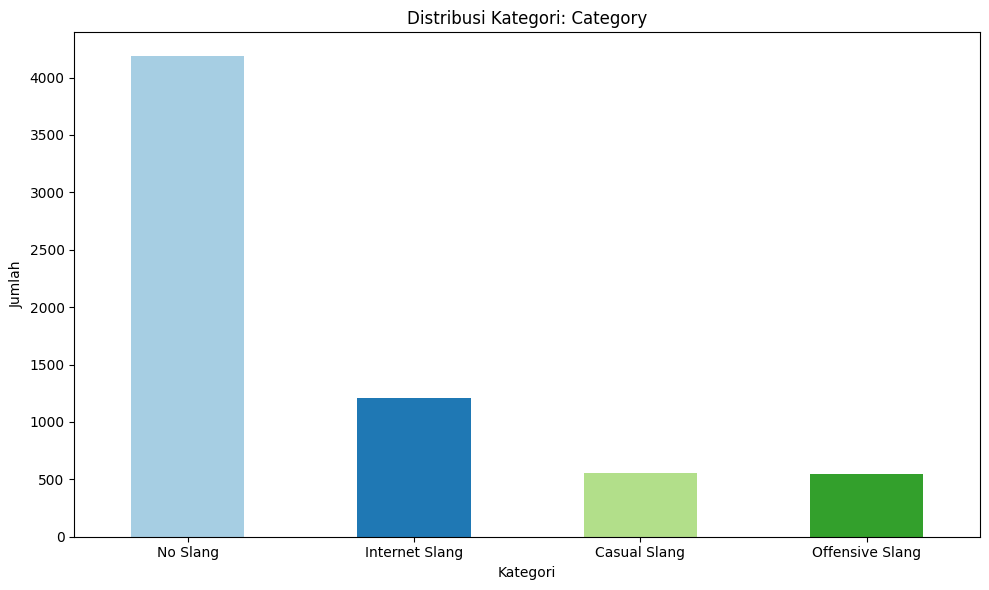

In [ ]:
# Calculate the value counts for the category column
category_counts = df['Category'].value_counts()

# Generate a list of colors for each bar
colors = plt.cm.Paired(range(len(category_counts)))  # Using a colormap for different colors

# Plot the distribution with different colors for each bar
plt.figure(figsize=(10,6))
category_counts.plot(kind='bar', color=colors)
plt.title(f'Distribusi Kategori: Category')
plt.xlabel('Kategori')
plt.ylabel('Jumlah')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


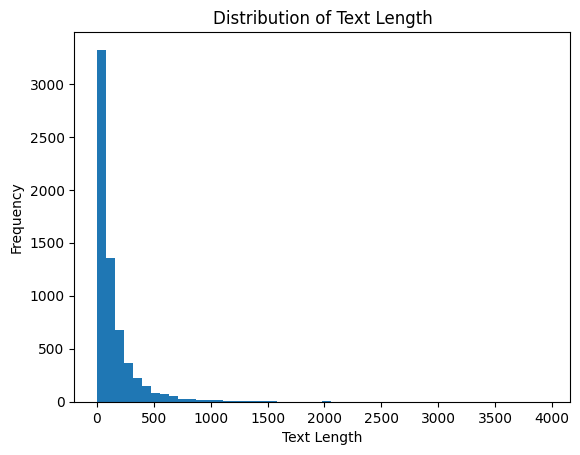

In [ ]:
# Visualize the distribution of text length
plt.hist(data['TextLength'], bins=50)

# Set the title and labels
plt.title('Distribution of Text Length')
plt.xlabel('Text Length')
plt.ylabel('Frequency')

# Show the plot
plt.show()


In [ ]:
def clean_text(text):
    text = text.lower()
    text = re.sub(r"http\S+|www\S+|https\S+", "", text)  # hapus URL
    text = re.sub(r"[^a-z\s]", "", text)  # hapus semua non-huruf
    text = re.sub(r"\s+", " ", text).strip()  # hapus spasi berlebih
    return text

data["Cleaned_Text"] = data["Text"].apply(clean_text)

In [ ]:
from collections import Counter
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')

stop_words = set(stopwords.words('english'))

all_words = ' '.join(data['Cleaned_Text']).split()
filtered_words = [word for word in all_words if word not in stop_words]
word_freq = Counter(filtered_words)
common_words = word_freq.most_common(20)  # 20 kata paling umum
common_words


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


[('like', 887),
 ('dont', 573),
 ('people', 568),
 ('one', 545),
 ('im', 486),
 ('get', 461),
 ('game', 436),
 ('would', 432),
 ('time', 416),
 ('think', 382),
 ('even', 365),
 ('good', 321),
 ('also', 311),
 ('thats', 305),
 ('know', 301),
 ('make', 287),
 ('really', 286),
 ('still', 284),
 ('much', 278),
 ('way', 278)]

<ipython-input-95-52c1c7d05f30>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(frequencies), y=list(words), palette='viridis')


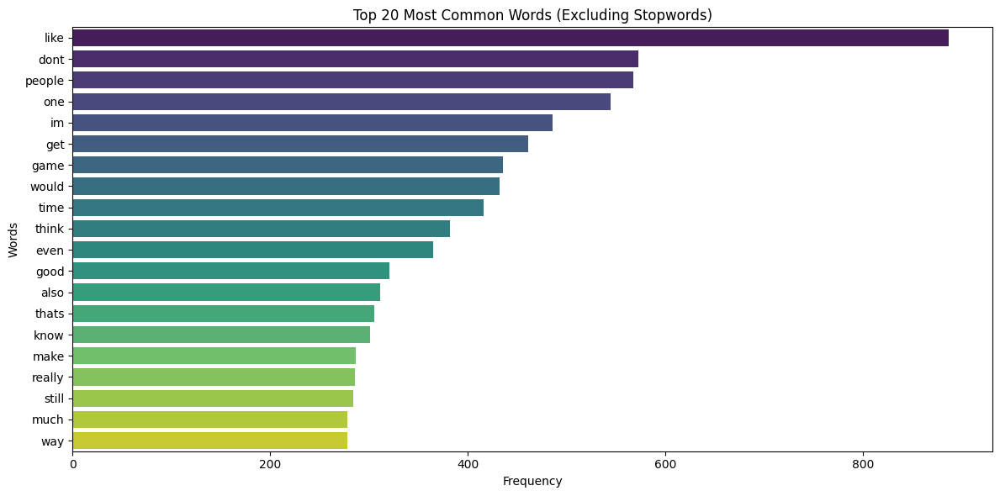

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Unpack kata-kata dan frekuensinya
words, frequencies = zip(*common_words)

# Set plot style
plt.figure(figsize=(12, 6))
sns.barplot(x=list(frequencies), y=list(words), palette='viridis')

# Tambahakan titles dan labels
plt.title('Top 20 Most Common Words (Excluding Stopwords)')
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.tight_layout()

plt.show()



In [ ]:
from nltk.util import ngrams
from collections import Counter
import nltk

nltk.download('punkt_tab')

# Tokenize semua text
all_tokens = nltk.word_tokenize(' '.join(data['Cleaned_Text']).lower())

# Buang stopwords dan non-alphabetic tokens
filtered_tokens = [word for word in all_tokens if word.isalpha() and word not in stop_words]

# Generate bigrams
bigrams = list(ngrams(filtered_tokens, 2))

# Hitung frekuensi bigram
bigram_freq = Counter(bigrams)
common_bigrams = bigram_freq.most_common(20)

# Visualize
import matplotlib.pyplot as plt
import seaborn as sns

# Mempersiapkan data
bigram_labels = [' '.join(bigram) for bigram, count in common_bigrams]
bigram_counts = [count for bigram, count in common_bigrams]

# Plot
plt.figure


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


<function matplotlib.pyplot.figure(num: 'int | str | Figure | SubFigure | None' = None, figsize: 'tuple[float, float] | None' = None, dpi: 'float | None' = None, *, facecolor: 'ColorType | None' = None, edgecolor: 'ColorType | None' = None, frameon: 'bool' = True, FigureClass: 'type[Figure]' = <class 'matplotlib.figure.Figure'>, clear: 'bool' = False, **kwargs) -> 'Figure'>

<ipython-input-97-b279786f65c3>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=bigram_counts, y=bigram_labels, palette='magma')


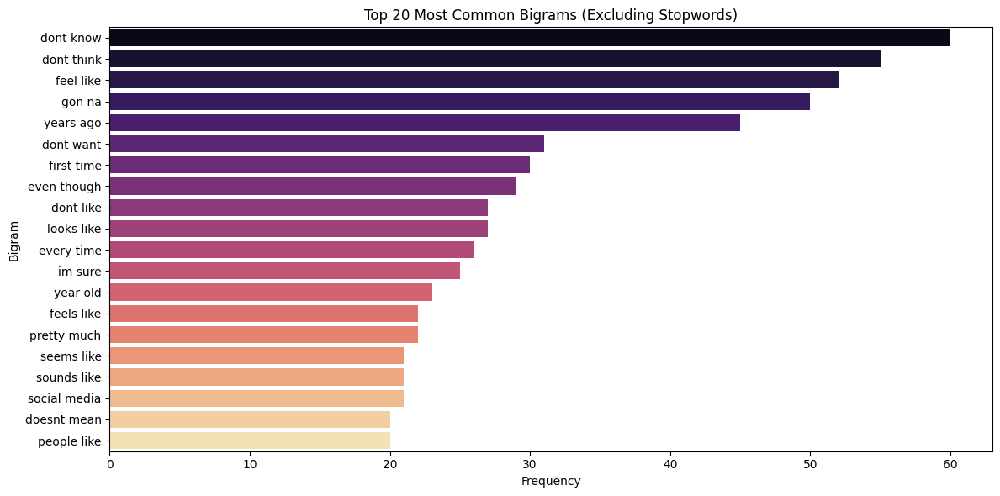

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x=bigram_counts, y=bigram_labels, palette='magma')

plt.title('Top 20 Most Common Bigrams (Excluding Stopwords)')
plt.xlabel('Frequency')
plt.ylabel('Bigram')
plt.tight_layout()
plt.show()  # <--- ini penting untuk menampilkan plot


# Data Preprocessing

In [ ]:
# Load the dataset
file_path = '/content/TargetData.csv'
# file_path = '/content/balanced_dataset nplug.csv'
df = pd.read_csv(file_path)

# text_column = 'Text'
text_column = 'Text'
label_column = 'Category'

# Show the first few rows of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6500 entries, 0 to 6499
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Text      6458 non-null   object
 1   Category  6500 non-null   object
dtypes: object(2)
memory usage: 101.7+ KB


In [ ]:
# Initialize the stemmer and lemmatizer
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

# Download necessary NLTK resources
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt_tab')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
df = df.dropna(subset=['Text'])
# df = df.dropna(subset=['processed_text'])
df = df.drop_duplicates()

In [ ]:
# 1. Case Folding
def case_folding(text):
    if isinstance(text, str):  # Check if the value is a string
        return text.lower()
    else:
        return ""  # Return an empty string for non-string values

In [ ]:
# 2. Data Cleaning (remove unwanted characters)
def clean_text(text):
    # Remove HTML tags, URLs, mentions (@user), hashtags (#), emojis, digits, and punctuation
    text = re.sub(r'<.*?>', '', text)  # Remove HTML tags
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub(r'@\w+', '', text)  # Remove mentions
    text = re.sub(r'#\w+', '', text)  # Remove hashtags
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = re.sub(r'\d+', '', text)  # Remove digits
    text = re.sub(r'[\U00010000-\U0010ffff]', '', text)  # Remove emojis
    text = text.strip()  # Remove leading and trailing spaces
    return text

In [ ]:
# 3. Tokenization
def tokenize(text):
    return word_tokenize(text)

In [ ]:
# 4. Stopwords Removal
def remove_stopwords(tokens):
    stop_words = set(stopwords.words('english'))  # Change to 'english' for English stopwords
    return [word for word in tokens if word not in stop_words]

In [ ]:
# 5. Stemming or Lemmatization
def stem_and_lemmatize(tokens, use_stemming=False):
    if use_stemming:
        return [stemmer.stem(word) for word in tokens]
    else:
        return [lemmatizer.lemmatize(word) for word in tokens]

In [ ]:
# 6. Manual Padding/Truncating (Not used)
def padding_truncating(tokens, max_len=10, pad_token=0):
    if len(tokens) < max_len:
        tokens = tokens + [pad_token] * (max_len - len(tokens))  # pad at the end
    elif len(tokens) > max_len:
        tokens = tokens[:max_len]  # truncate from the end
    return tokens

In [ ]:
# Apply all steps to the dataset
def preprocess_text(text, use_stemming=False):
    text = case_folding(text)  # Step 1: Case folding
    text = clean_text(text)  # Step 2: Data cleaning
    tokens = tokenize(text)  # Step 3: Tokenization
    tokens = remove_stopwords(tokens)  # Step 4: Stopwords removal
    tokens = stem_and_lemmatize(tokens, use_stemming)  # Step 5: Stemming/Lemmatization
    return tokens

In [ ]:
# Apply preprocessing to each row in the dataset
df['processed_text'] = df[text_column].apply(preprocess_text)
df['processed_text'] = df['processed_text'].apply(lambda x: ' '.join(x))

In [ ]:
# Example of Padding/Truncating and Text-to-Numeric Transformation
# Assuming 'processed_text' column contains tokenized text
# df['padded_text'] = df['processed_text'].apply(lambda x: padding_truncating(x, max_len=100))
# df['padded_text'] = df['padded_text'].apply(lambda x: ' '.join(x))

In [ ]:
# Define a custom mapping for categories
category_mapping = {
    "Casual Slang": 0,
    "Internet Slang": 1,
    "Offensive Slang": 2,
    "No Slang": 3
}

# Apply the mapping to the 'Category' column
df["Category_Label"] = df["Category"].map(category_mapping)

# Check the results
print(df[["Category", "Category_Label"]].head(10))

          Category  Category_Label
0         No Slang               3
1         No Slang               3
2  Offensive Slang               2
3         No Slang               3
4         No Slang               3
5         No Slang               3
6         No Slang               3
7         No Slang               3
8  Offensive Slang               2
9   Internet Slang               1


In [ ]:
df_sample = df.sample(n=10, random_state=42)
df_sample

,Text,Category,processed_text,Category_Label
1167,I’m old. Everything I see on the internet seem...,No Slang,im old everything see internet seems like satu...,3
5198,First off how is it related to homosexuality i...,No Slang,first related homosexuality way second insult ...,3
5748,I hate the extra clothes I have to wear during...,No Slang,hate extra clothes wear winter,3
1338,no one noticed - the marias,No Slang,one noticed maria,3
5037,![gif](giphy|UW3xcQLjHTDfkSN0a0),Internet Slang,gifgiphyuwxcqljhtdfksna,1
4128,Cat discovers cat toy!,No Slang,cat discovers cat toy,3
3220,Hunt showdown for sure!,No Slang,hunt showdown sure,3
5462,Someone who doesn’t want to communicate when s...,No Slang,someone doesnt want communicate something both...,3
4341,Go to You Tube look for Jon Stewart on DOGE - ...,Internet Slang,go tube look jon stewart doge give literal num...,1
4611,"""You've come back at a low point""",No Slang,youve come back low point,3


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=10)  # Limit to 10 features for simplicity

# Apply TF-IDF transformation
X_tfidf = tfidf_vectorizer.fit_transform(df['processed_text'])

# Convert sparse matrix to DataFrame
X_tfidf_df = pd.DataFrame(X_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Set the original text as index
X_tfidf_df.index = df['processed_text']

# Sample 10 rows
sampled_data = X_tfidf_df.sample(n=10, random_state=42)

# Show sampled data with text index
sampled_data


,dont,game,get,im,like,one,people,think,time,would
processed_text,,,,,,,,,,
im old everything see internet seems like saturday night skit,0.0,0.0,0.0,0.7687,0.63961,0.0,0.0,0.0,0.0,0.0
first related homosexuality way second insult either,0.0,0.0,0.0,0.0000,0.00000,0.0,0.0,0.0,0.0,0.0
hate extra clothes wear winter,0.0,0.0,0.0,0.0000,0.00000,0.0,0.0,0.0,0.0,0.0
one noticed maria,0.0,0.0,0.0,0.0000,0.00000,1.0,0.0,0.0,0.0,0.0
gifgiphyuwxcqljhtdfksna,0.0,0.0,0.0,0.0000,0.00000,0.0,0.0,0.0,0.0,0.0
cat discovers cat toy,0.0,0.0,0.0,0.0000,0.00000,0.0,0.0,0.0,0.0,0.0
hunt showdown sure,0.0,0.0,0.0,0.0000,0.00000,0.0,0.0,0.0,0.0,0.0
someone doesnt want communicate something bothering,0.0,0.0,0.0,0.0000,0.00000,0.0,0.0,0.0,0.0,0.0
go tube look jon stewart doge give literal number lie b v actual fact cut without harming single american citizen,0.0,0.0,0.0,0.0000,0.00000,0.0,0.0,0.0,0.0,0.0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Initialize CountVectorizer for Bag of Words
count_vectorizer = CountVectorizer(max_features=10)  # Limit to 10 features for simplicity

# Apply Bag of Words transformation
X_bow = count_vectorizer.fit_transform(df['processed_text'])

# Convert sparse matrix to DataFrame
X_bow_df = pd.DataFrame(X_bow.toarray(), columns=count_vectorizer.get_feature_names_out())

# Set the original text as index
X_bow_df.index = df['processed_text']

# Sample 10 rows
sampled_data_bow = X_bow_df.sample(n=10, random_state=42)

# Show sampled data with text index
sampled_data_bow


,dont,game,get,im,like,one,people,think,time,would
processed_text,,,,,,,,,,
im old everything see internet seems like saturday night skit,0,0,0,1,1,0,0,0,0,0
first related homosexuality way second insult either,0,0,0,0,0,0,0,0,0,0
hate extra clothes wear winter,0,0,0,0,0,0,0,0,0,0
one noticed maria,0,0,0,0,0,1,0,0,0,0
gifgiphyuwxcqljhtdfksna,0,0,0,0,0,0,0,0,0,0
cat discovers cat toy,0,0,0,0,0,0,0,0,0,0
hunt showdown sure,0,0,0,0,0,0,0,0,0,0
someone doesnt want communicate something bothering,0,0,0,0,0,0,0,0,0,0
go tube look jon stewart doge give literal number lie b v actual fact cut without harming single american citizen,0,0,0,0,0,0,0,0,0,0


In [ ]:
import pandas as pd
import numpy as np
from gensim.models import FastText
from nltk.tokenize import word_tokenize

# Example: assuming df['processed_text'] exists and is clean text

# Tokenize text column
df['tokens'] = df['processed_text'].apply(word_tokenize)

# Train FastText model on tokens
fasttext_model = FastText(sentences=df['tokens'], vector_size=10, window=5, min_count=1, workers=4, sg=1)

# Function to get average FastText vector for a document
def document_vector(doc):
    doc = [word for word in doc if word in fasttext_model.wv.key_to_index]
    if not doc:
        return np.zeros(fasttext_model.vector_size)
    return np.mean([fasttext_model.wv[word] for word in doc], axis=0)

# Create document vectors for all rows
vectors = np.array([document_vector(tokens) for tokens in df['tokens']])

# Create DataFrame with vectors, use original text as index
fasttext_df = pd.DataFrame(vectors, columns=[f'vec_{i}' for i in range(fasttext_model.vector_size)])
fasttext_df.index = df['processed_text']

# Set pandas option to display full text index without truncation
pd.set_option('display.max_colwidth', None)

# Sample 10 rows
sampled_fasttext = fasttext_df.sample(n=10, random_state=42)

sampled_fasttext


,vec_0,vec_1,vec_2,vec_3,vec_4,vec_5,vec_6,vec_7,vec_8,vec_9
processed_text,,,,,,,,,,
im old everything see internet seems like saturday night skit,0.336965,-0.096160,0.094232,-1.143991,0.920307,0.084028,1.538042,1.465676,0.416523,-1.222279
first related homosexuality way second insult either,0.219409,-0.059803,0.088827,-1.305958,0.973922,-0.075669,1.603009,1.525521,0.466217,-1.346043
hate extra clothes wear winter,0.279485,-0.038434,0.063329,-1.411059,0.991287,-0.046707,1.615150,1.562571,0.487072,-1.385793
one noticed maria,0.303094,-0.071749,0.107293,-1.315858,0.982074,-0.046369,1.627067,1.608264,0.520024,-1.388221
gifgiphyuwxcqljhtdfksna,0.040560,-0.003813,0.016855,-0.160012,0.116690,-0.012745,0.171236,0.178090,0.056178,-0.163406
cat discovers cat toy,0.269859,-0.096378,0.039119,-1.326934,0.919082,-0.023060,1.526936,1.501825,0.419653,-1.296400
hunt showdown sure,0.367694,-0.125492,0.089850,-1.209963,0.822448,0.057111,1.519081,1.458055,0.420232,-1.244842
someone doesnt want communicate something bothering,0.541807,-0.133439,0.113788,-1.143432,0.998181,0.152004,1.747921,1.697479,0.447401,-1.257262
go tube look jon stewart doge give literal number lie b v actual fact cut without harming single american citizen,0.298195,-0.063316,0.063915,-1.274669,0.903497,-0.026171,1.483071,1.472466,0.432357,-1.255831


In [ ]:
# df.to_csv('cleaned_data.csv', index=False)

# Data Augmentation

In [ ]:
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


True

In [ ]:
# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Columns: 'processed_text' and 'Category_Label'

# Count class distribution
class_counts = dict(Counter(df['Category_Label']))
max_class_count = class_counts[3]

# Augmenter
syn_aug = naw.SynonymAug(aug_src='wordnet')

augmented_rows = []

# Upsample underrepresented classes
for label in [0, 1, 2]:
    current_df = df[df['Category_Label'] == label]
    num_needed = max_class_count - len(current_df)
    i = 0
    new_texts = []

    while i < num_needed:
        for _, row in current_df.iterrows():
            if i >= num_needed:
                break
            augmented_text = syn_aug.augment(row['processed_text'])
            new_texts.append({'processed_text': augmented_text, 'Category_Label': label})
            i += 1

    augmented_rows.extend(new_texts)

# Combine original and augmented
augmented_df = pd.DataFrame(augmented_rows)
balanced_df = pd.concat([df, augmented_df], ignore_index=True).sample(frac=1).reset_index(drop=True)

# Save if needed
balanced_df.to_csv('balanced_dataset_nlpaug.csv', index=False)

print("Original class distribution:", class_counts)
print("New class distribution:", Counter(balanced_df['Category_Label']))


Original class distribution: {3: 4151, 2: 541, 1: 1137, 0: 556}
New class distribution: Counter({3: 4151, 0: 4151, 1: 4151, 2: 4151})


In [3]:
# Load the dataset
file_path = 'balanced_dataset_nlpaug.csv'
df = pd.read_csv(file_path)

text_column = 'processed_text'
label_column = 'Category_Label'

# Show the first few rows of the dataset
print(df['Category_Label'].value_counts())
df.info()

Category_Label
3    4151
0    4151
1    4151
2    4151
Name: count, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16604 entries, 0 to 16603
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Text            6385 non-null   object
 1   Category        6385 non-null   object
 2   processed_text  16545 non-null  object
 3   Category_Label  16604 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 519.0+ KB


In [4]:
df[text_column] = df[text_column].str.strip("[]'")

In [5]:
print(df[text_column].head(5))
print(type(df[text_column].iloc[0]))


0                                        exactly
1              hog zoological term ophidian cock
2    better question ever time female good thing
3                    cut leg im amputee god damn
4                                             ok
Name: processed_text, dtype: object
<class 'str'>


# Models Building

In [6]:
pd.set_option('display.max_colwidth', None)  # This will prevent truncation of text in columns

import matplotlib.pyplot as plt

def error_analysis(clf, X_test, y_test, X_test_raw, sample_size=10):
    # Predict on test data
    y_pred = clf.predict(X_test)

    # Ensure y_test and y_pred are Series for safe comparison
    y_test = pd.Series(y_test).reset_index(drop=True)
    y_pred = pd.Series(y_pred).reset_index(drop=True)
    X_test_raw = pd.Series(X_test_raw).reset_index(drop=True)

    # Combine into one DataFrame
    results = pd.DataFrame({
        'Text': X_test_raw,
        'True Label': y_test,
        'Predicted Label': y_pred
    })

    # Misclassified and Correctly Classified samples
    misclassified_samples = results[results['True Label'] != results['Predicted Label']]
    correct_samples = results[results['True Label'] == results['Predicted Label']]

    # Plot Correct vs Misclassified
    counts = [len(correct_samples), len(misclassified_samples)]
    labels = ['Correct', 'Misclassified']
    colors = ['#4CAF50', '#F44336']

    plt.figure(figsize=(6, 4))
    plt.bar(labels, counts, color=colors)
    plt.title('Classification Results')
    plt.ylabel('Number of Samples')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # -----------------------------------------
    # Show 5 misclassified samples per true label
    # -----------------------------------------
    print("\nSample Misclassified Examples per True Label:\n")
    grouped = misclassified_samples.groupby("True Label")
    for label, group in grouped:
        print(f"Label {label} - Total Misclassified: {len(group)}")
        sample = group.sample(min(sample_size, len(group)), random_state=42)
        print(sample[['Text', 'Predicted Label']])
        print("-" * 60)

    # Print summary and examples
    print("================================================")
    print(f"Total Misclassified Samples: {counts[1]}")
    print(f"\nMisclassified Samples (random {sample_size} examples):\n")
    if counts[1] > 0:
        print(misclassified_samples.sample(min(sample_size, counts[1]), random_state=41))
    else:
        print("No misclassified samples.")
    print("_______________________________________________")

    print("================================================")
    print(f"\nTotal Correctly Classified Samples: {counts[0]}")
    print(f"\nCorrectly Classified Samples (random {sample_size} examples):\n")
    if counts[0] > 0:
        print(correct_samples.sample(min(sample_size, counts[0]), random_state=41))
    else:
        print("No correctly classified samples.")
    print("_______________________________________________")

    print("================================================")
    print("\nMost Common Misclassifications:\n")
    if counts[1] > 0:
        print(
            misclassified_samples.groupby(['True Label', 'Predicted Label'])
            .size()
            .reset_index(name='Count')
            .sort_values(by='Count', ascending=False)
        )
    else:
        print("No misclassifications to show.")
    print("_______________________________________________")

# Function to print model performance scores
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        # Predict on training data
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))

        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")

    elif train == False:
        # Predict on test data
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))

        print("Test Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")

        # Confusion Matrix for Test Data
        cm = confusion_matrix(y_test, pred)
        print(f"Confusion Matrix: \n{cm}\n")

        # Visualize the Confusion Matrix using Seaborn Heatmap
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=clf.classes_, yticklabels=clf.classes_)
        plt.title('Confusion Matrix for Test Data')
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.show()

        # Perform error analysis
        # Tambahkan X_test_raw saat memanggil error_analysis
        # error_analysis(clf, X_test, y_test, X_test_raw)


## TF-IDF

In [7]:
df = df.dropna(subset=['processed_text', 'Category_Label'])

X = df['processed_text']
y = df['Category_Label']

X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer()
X_train = tfidf_vectorizer.fit_transform(X_train_raw)
X_test = tfidf_vectorizer.transform(X_test_raw)


### 1. Decision Tree Classifier

In [ ]:
# Define parameter grid
param_grid = {
    'max_depth': list(range(1, 31))  # try depths from 1 to 30
}

# Create model
tree_clf = DecisionTreeClassifier(random_state=42)

# Create grid search with cross-validation
grid_search = GridSearchCV(
    tree_clf,
    param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='accuracy',  # or 'f1_macro', etc.
    n_jobs=-1,  # use all CPU cores
    verbose=1
)

# Fit search
grid_search.fit(X_train, y_train)

# Best depth
print("Best max_depth:", grid_search.best_params_['max_depth'])
print("Best cross-validated score:", grid_search.best_score_)

# Best model
best_tree = grid_search.best_estimator_

# Evaluate on test set
print_score(best_tree, X_train, y_train, X_test, y_test, train=True)
print_score(best_tree, X_train, y_train, X_test, y_test, train=False)


Mean CV Accuracy: 0.458900117216435
Train Result:
Accuracy Score: 50.17%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.345707     0.994457     0.984281     0.634628  0.501738   
recall        0.959916     0.271654     0.488742     0.283409  0.501738   
f1-score      0.508339     0.426736     0.653159     0.391835  0.501738   
support    3318.000000  3302.000000  3331.000000  3285.000000  0.501738   

              macro avg  weighted avg  
precision      0.739768      0.739963  
recall         0.500930      0.501738  
f1-score       0.495018      0.495513  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[3185    0    9  124]
 [2142  897    0  263]
 [1554    0 1628  149]
 [2332    5   17  931]]

Test Result:
Accuracy Score: 45.63%
_______________________________________________
CLASSIFICATION REPORT:
           

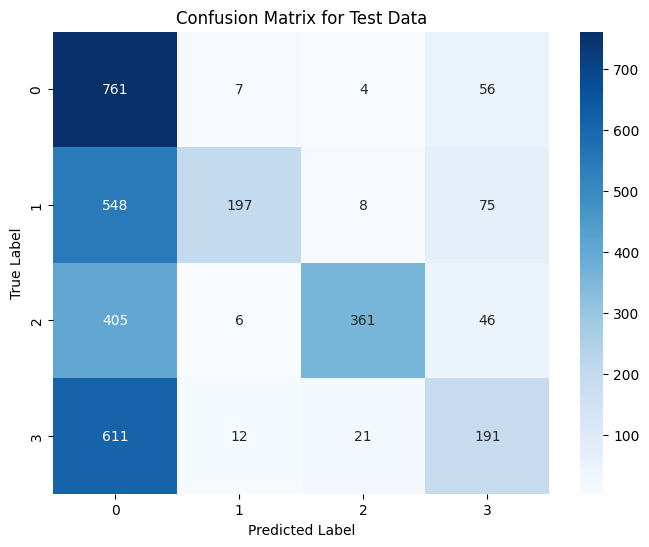

In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

tree_clf = DecisionTreeClassifier(max_depth=30, random_state=42)

# 5-fold cross-validation score
cv_scores = cross_val_score(tree_clf, X_train, y_train, cv=5, scoring='accuracy')

print("Mean CV Accuracy:", np.mean(cv_scores))

# Then train on full data if satisfied
tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)


In [ ]:
tree_clf = DecisionTreeClassifier(max_depth=30, random_state=42)

tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

In [ ]:
# Get the depth of the trained tree
depth = tree_clf.get_depth()
print(f"Depth of the decision tree: {depth}")


Depth of the decision tree: 30


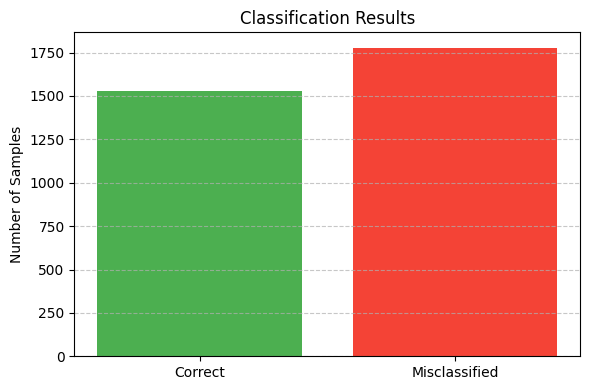


Sample Misclassified Examples per True Label:

Label 0 - Total Misclassified: 66
                                                                                                                                                                                                                                                                                                                                                               Text  \
2736                                                                                                                                                                                                                                          im gaming boat booster stopped playing ive wanting get back favour playing people want oeuvre together rather randoms   
3064                                                                                                                                                                                                    

In [ ]:
error_analysis(tree_clf, X_test, y_test, X_test_raw)

In [ ]:
# Create a pipeline for LIME
class_names = ['0', '1', '2', '3']
pipeline = make_pipeline(tfidf_vectorizer, tree_clf)

# LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Select an instance to explain
idx = 1577
text_instance = X_test_raw.iloc[idx]

# Explain the prediction
lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=1000, labels=[0, 1, 2, 3])

# Show explanation in notebook
lime_exp.show_in_notebook()
# Save as HTML
lime_exp.save_to_file('lime_explanation_TD-IDF_DT.html')


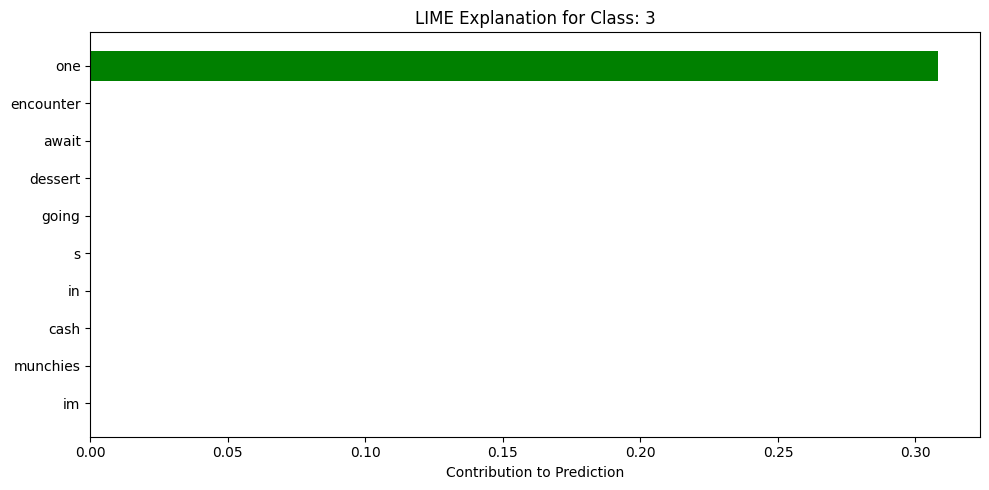

In [ ]:
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

# Buat pipeline LIME
class_names = ['0', '1', '2', '3']
pipeline = make_pipeline(tfidf_vectorizer, tree_clf)

# Inisialisasi explainer
lime_explainer = LimeTextExplainer(class_names=class_names)

# Pilih instance
idx = 1577
text_instance = X_test_raw.iloc[idx]

# Dapatkan penjelasan
lime_exp = lime_explainer.explain_instance(
    text_instance,
    pipeline.predict_proba,
    num_features=10,  # jumlah kata penting yang ditampilkan
    labels=[0, 1, 2, 3]
)

# PILIH LABEL yang mau diplot
label_to_plot = pipeline.predict([text_instance])[0]  # atau set manual, e.g., label_to_plot = 2

# Ambil daftar kata penting dan kontribusinya
important_words = dict(lime_exp.as_list(label=label_to_plot))

# Buat bar chart
plt.figure(figsize=(10, 5))
colors = ['green' if v > 0 else 'red' for v in important_words.values()]
plt.barh(list(important_words.keys()), important_words.values(), color=colors)
plt.xlabel('Contribution to Prediction')
plt.title(f'LIME Explanation for Class: {class_names[int(label_to_plot)]}')
plt.gca().invert_yaxis()  # supaya kata paling penting di atas
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from collections import Counter
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline

# Make sure to fit your classifier and vectorizer before this step
# Assumes:
# - best_tree is your trained DecisionTreeClassifier
# - tfidf_vectorizer is your fitted TF-IDF vectorizer
# - X_test is your test vector data
# - y_test is the corresponding labels (Pandas Series)
# - X_test_raw is the raw text for the test set (Pandas Series)

# Setup pipeline for LIME
class_names = sorted(y_test.unique().astype(str))
pipeline = make_pipeline(tfidf_vectorizer, tree_clf)

# Initialize LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Get misclassified sample indices
misclassified_idxs = np.where(y_test.to_numpy() != tree_clf.predict(X_test))[0]

# Limit to avoid long computation
misclassified_idxs = misclassified_idxs[:50]

# Track most common features
feature_counter = Counter()

print(f"Analyzing {len(misclassified_idxs)} misclassified samples...\n")

for idx in misclassified_idxs:
    text_instance = X_test_raw.iloc[idx]

    # Skip empty or non-string texts
    if not isinstance(text_instance, str) or len(text_instance.strip()) == 0:
        continue

    try:
        lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=20)
        for feature, weight in lime_exp.as_list():
            feature_counter[feature] += 1
    except Exception as e:
        print(f"Skipping index {idx} due to error: {e}")
        continue

# Display most common influential features
print("Most common influential features in misclassified samples:")
for feature, count in feature_counter.most_common(20):
    print(f"{feature}: {count} times")


Analyzing 50 misclassified samples...

Most common influential features in misclassified samples:
thats: 5 times
people: 3 times
year: 3 times
go: 3 times
could: 2 times
say: 2 times
take: 2 times
society: 2 times
use: 2 times
cant: 2 times
called: 2 times
sure: 2 times
up: 2 times
around: 2 times
certain: 2 times
call: 2 times
place: 2 times
dont: 2 times
see: 2 times
like: 2 times


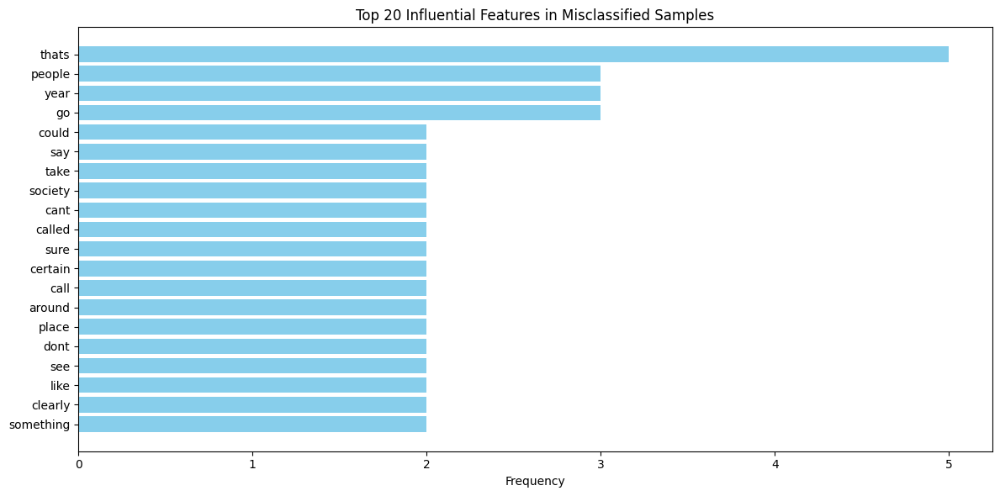

In [ ]:
# Get the top N features to plot
top_n = 20
top_features = feature_counter.most_common(top_n)

if top_features:
    features, counts = zip(*top_features)

    plt.figure(figsize=(12, 6))
    plt.barh(features, counts, color='skyblue')
    plt.gca().invert_yaxis()  # Highest count at the top
    plt.xlabel("Frequency")
    plt.title(f"Top {top_n} Influential Features in Misclassified Samples")
    plt.tight_layout()
    plt.show()
else:
    print("No influential features to plot.")


Mean CV Accuracy: 0.4644155670730246


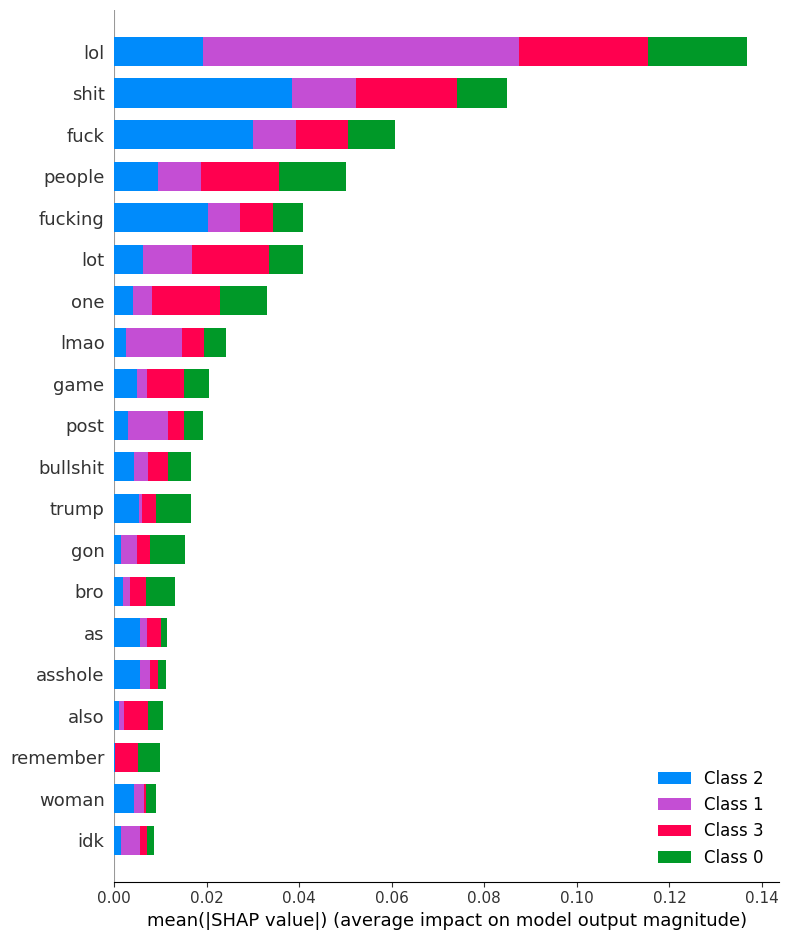

In [ ]:
import numpy as np
import shap
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Assuming X_train, X_test are sparse TF-IDF matrices, y_train/y_test are labels

# Convert sparse TF-IDF to dense numpy arrays (be cautious with memory if data is large)
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()

# Train the Decision Tree
tree_clf = DecisionTreeClassifier(max_depth=30, random_state=42)

# 5-fold cross-validation score
cv_scores = cross_val_score(tree_clf, X_train, y_train, cv=5, scoring='accuracy')

print("Mean CV Accuracy:", np.mean(cv_scores))

# Then train on full data if satisfied
tree_clf.fit(X_train, y_train)

# Select subset for SHAP explanation
X_explain = X_test_dense[:100].astype(np.float32)  # 100 samples to explain

# Initialize SHAP TreeExplainer
explainer = shap.Explainer(tree_clf)

# Calculate SHAP values
shap_values = explainer(X_explain)

# Plot summary (global feature importance)
feature_names = tfidf_vectorizer.get_feature_names_out()
shap.summary_plot(shap_values, X_explain, feature_names=feature_names)


In [ ]:
dot_data = export_graphviz(
    best_tree,
    out_file=None,
    feature_names=tfidf_vectorizer.get_feature_names_out(),
    class_names=[str(cls) for cls in best_tree.classes_],
    filled=True,
    rounded=True,
    special_characters=True,
)

graph = graphviz.Source(dot_data)
graph.render("tree_TD-IDF_DT", format="png", cleanup=False)  # saves as tree.png


'tree_TD-IDF_DT.png'

In [ ]:
test_score = accuracy_score(y_test, best_tree.predict(X_test)) * 100
train_score = accuracy_score(y_train, best_tree.predict(X_train)) * 100

results_df = pd.DataFrame(data=[["Decision Tree Classifier", train_score, test_score]], columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df


,Model,Training Accuracy %,Testing Accuracy %
0,Decision Tree Classifier,50.649743,46.267755


### 2. Naive Bayes

Train Result:
Accuracy Score: 92.38%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.920691     0.966243     0.886475     0.930366  0.923769   
recall        0.948162     0.875530     0.979886     0.890715  0.923769   
f1-score      0.934224     0.918653     0.930843     0.910109  0.923769   
support    3318.000000  3302.000000  3331.000000  3285.000000  0.923769   

              macro avg  weighted avg  
precision      0.925944      0.925845  
recall         0.923573      0.923769  
f1-score       0.923457      0.923503  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[3146   18  103   51]
 [ 108 2891  148  155]
 [  43   11 3264   13]
 [ 120   72  167 2926]]

Test Result:
Accuracy Score: 80.21%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1           2  

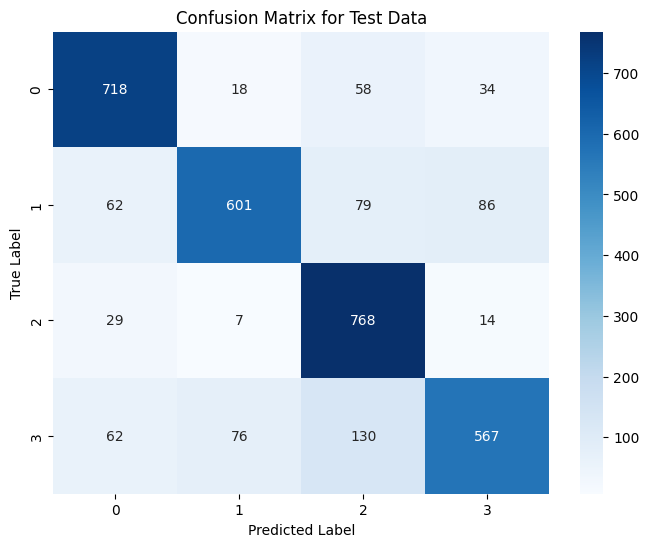

In [8]:
# Inisialisasi dan latih model Naive Bayes
nb_clf = MultinomialNB()
nb_clf.fit(X_train, y_train)

# Evaluasi model Naive Bayes
print_score(nb_clf, X_train, y_train, X_test, y_test, train=True)
print_score(nb_clf, X_train, y_train, X_test, y_test, train=False)

2025-05-24 21:59:36.982 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 21:59:37.194 
  command:

    streamlit run c:\personal\Code\S6\NLP\Natural-Languange_Processing\.venv\Lib\site-packages\ipykernel_launcher.py [ARGUMENTS]
2025-05-24 21:59:37.196 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 21:59:37.200 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 21:59:37.201 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 21:59:37.205 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 21:59:37.206 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 21

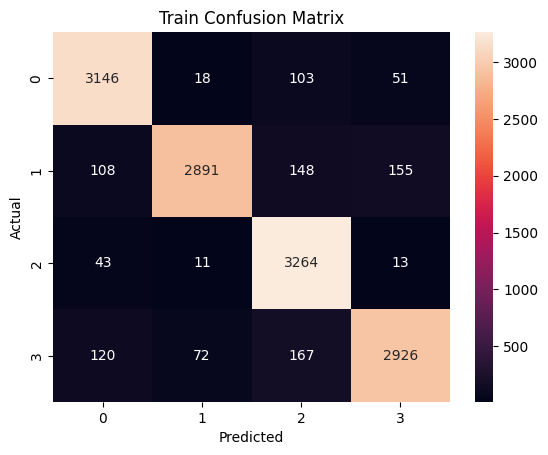

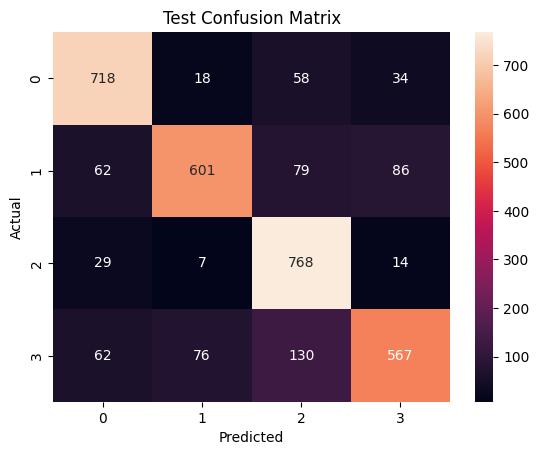

In [9]:
import streamlit as st
import os
import joblib
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assume X_train, X_test, y_train, y_test are defined or loaded here
# For demo purpose, you need to replace this with your actual data loading code
# Example:
# from your_data_module import X_train, X_test, y_train, y_test

MODEL_PATH = "naive_bayes_model.pkl"

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        data = "Train"
        true_labels = y_train
    else:
        pred = clf.predict(X_test)
        data = "Test"
        true_labels = y_test
    
    acc = accuracy_score(true_labels, pred)
    st.write(f"### {data} Accuracy: {acc:.4f}")
    st.write(f"### {data} Classification Report")
    st.text(classification_report(true_labels, pred))
    
    cm = confusion_matrix(true_labels, pred)
    fig, ax = plt.subplots()
    sns.heatmap(cm, annot=True, fmt='d', ax=ax)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_title(f'{data} Confusion Matrix')
    st.pyplot(fig)

def main():
    st.title("Naive Bayes Model Dashboard with Saving/Loading")

    # Load or train model
    if os.path.exists(MODEL_PATH):
        nb_clf = joblib.load(MODEL_PATH)
        st.success("Loaded existing Naive Bayes model.")
    else:
        st.info("Training Naive Bayes model, please wait...")
        nb_clf = MultinomialNB()
        nb_clf.fit(X_train, y_train)
        joblib.dump(nb_clf, MODEL_PATH)
        st.success("Model trained and saved!")

    # Show evaluation metrics
    print_score(nb_clf, X_train, y_train, X_test, y_test, train=True)
    print_score(nb_clf, X_train, y_train, X_test, y_test, train=False)

    # Optional: add prediction on new input here if you want

if __name__ == "__main__":
    main()


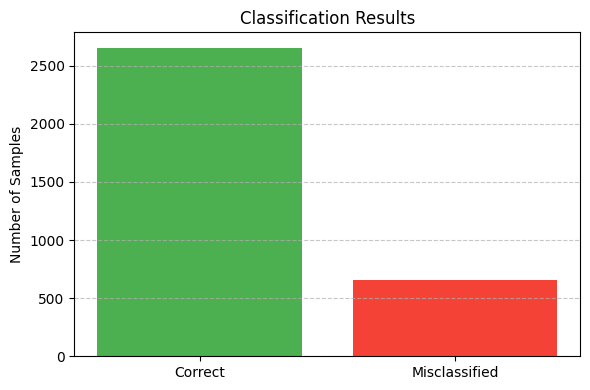


Sample Misclassified Examples per True Label:

Label 0 - Total Misclassified: 110
                                                                                                                                                                                                                                                                                                                                                                                                                              Text  \
2390                                                                                                                                                                                                                                                                                                                                                                                                                                 
431                                                                      

In [ ]:
error_analysis(nb_clf, X_test, y_test, X_test_raw)

In [ ]:
# Create a pipeline for LIME
class_names = ['0', '1', '2', '3']
pipeline = make_pipeline(tfidf_vectorizer, nb_clf)

# LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Select an instance to explain
idx = 2110
text_instance = X_test_raw.iloc[idx]

# Explain the prediction
lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=1000, labels=[0, 1, 2, 3])

# Show explanation in notebook
lime_exp.show_in_notebook()
# Save as HTML
lime_exp.save_to_file('lime_explanation_TD-IDF_NB.html')


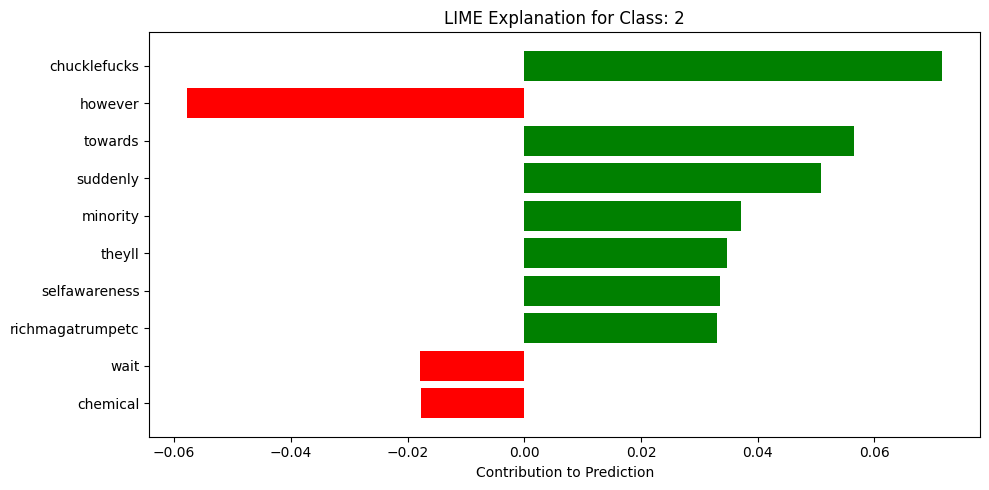

In [ ]:
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

# Buat pipeline LIME
class_names = ['0', '1', '2', '3']
pipeline = make_pipeline(tfidf_vectorizer, nb_clf)

# Inisialisasi explainer
lime_explainer = LimeTextExplainer(class_names=class_names)

# Pilih instance
idx = 237

text_instance = X_test_raw.iloc[idx]

# Dapatkan penjelasan
lime_exp = lime_explainer.explain_instance(
    text_instance,
    pipeline.predict_proba,
    num_features=10,  # jumlah kata penting yang ditampilkan
    labels=[0, 1, 2, 3]
)

# PILIH LABEL yang mau diplot
label_to_plot = pipeline.predict([text_instance])[0]  # atau set manual, e.g., label_to_plot = 2

# Ambil daftar kata penting dan kontribusinya
important_words = dict(lime_exp.as_list(label=label_to_plot))

# Buat bar chart
plt.figure(figsize=(10, 5))
colors = ['green' if v > 0 else 'red' for v in important_words.values()]
plt.barh(list(important_words.keys()), important_words.values(), color=colors)
plt.xlabel('Contribution to Prediction')
plt.title(f'LIME Explanation for Class: {class_names[int(label_to_plot)]}')
plt.gca().invert_yaxis()  # supaya kata paling penting di atas
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from collections import Counter
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline

# Make sure to fit your classifier and vectorizer before this step
# Assumes:
# - best_tree is your trained DecisionTreeClassifier
# - tfidf_vectorizer is your fitted TF-IDF vectorizer
# - X_test is your test vector data
# - y_test is the corresponding labels (Pandas Series)
# - X_test_raw is the raw text for the test set (Pandas Series)

# Setup pipeline for LIME
class_names = sorted(y_test.unique().astype(str))
pipeline = make_pipeline(tfidf_vectorizer, nb_clf)

# Initialize LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Get misclassified sample indices
misclassified_idxs = np.where(y_test.to_numpy() != nb_clf.predict(X_test))[0]

# Limit to avoid long computation
misclassified_idxs = misclassified_idxs[:50]

# Track most common features
feature_counter = Counter()

print(f"Analyzing {len(misclassified_idxs)} misclassified samples...\n")

for idx in misclassified_idxs:
    text_instance = X_test_raw.iloc[idx]

    # Skip empty or non-string texts
    if not isinstance(text_instance, str) or len(text_instance.strip()) == 0:
        continue

    try:
        lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=20)
        for feature, weight in lime_exp.as_list():
            feature_counter[feature] += 1
    except Exception as e:
        print(f"Skipping index {idx} due to error: {e}")
        continue

# Display most common influential features
print("Most common influential features in misclassified samples:")
for feature, count in feature_counter.most_common(20):
    print(f"{feature}: {count} times")


Analyzing 50 misclassified samples...

Most common influential features in misclassified samples:
time: 4 times
word: 4 times
would: 3 times
make: 3 times
could: 2 times
dumb: 2 times
know: 2 times
live: 2 times
transposition: 2 times
im: 2 times
kid: 2 times
clown: 2 times
house: 2 times
post: 2 times
woman: 2 times
creepy: 2 times
lot: 2 times
youre: 2 times
man: 2 times
anything: 2 times


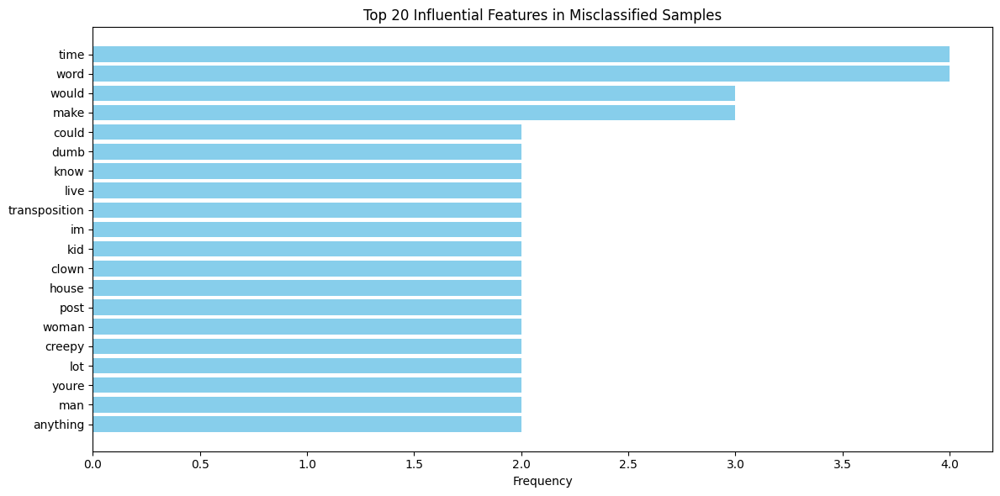

In [ ]:
# Get the top N features to plot
top_n = 20
top_features = feature_counter.most_common(top_n)

if top_features:
    features, counts = zip(*top_features)

    plt.figure(figsize=(12, 6))
    plt.barh(features, counts, color='skyblue')
    plt.gca().invert_yaxis()  # Highest count at the top
    plt.xlabel("Frequency")
    plt.title(f"Top {top_n} Influential Features in Misclassified Samples")
    plt.tight_layout()
    plt.show()
else:
    print("No influential features to plot.")


In [ ]:
import numpy as np
import shap
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split

# Assume X_train, X_test are sparse TF-IDF matrices, y_train, y_test are labels
# and tfidf_vectorizer is your fitted TF-IDF vectorizer

# Convert sparse matrices to dense (be careful with memory)
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()

# Train MultinomialNB
nb_clf = MultinomialNB()
nb_clf.fit(X_train_dense, y_train)

# Select a small background dataset for KernelExplainer (e.g. 100 samples)
background = X_train_dense[np.random.choice(X_train_dense.shape[0], 100, replace=False)]

# Create prediction function for KernelExplainer
def predict_proba(X):
    return nb_clf.predict_proba(X)

# Initialize KernelExplainer with the prediction function and background data
explainer = shap.KernelExplainer(predict_proba, background)

# Select a small subset to explain (e.g. 10 samples)
X_explain = X_test_dense[:10]

# Calculate SHAP values (list of arrays, one per class)
shap_values = explainer.shap_values(X_explain)

# Get feature names from TF-IDF vectorizer
feature_names = tfidf_vectorizer.get_feature_names_out()

# Choose class index to explain (e.g. 1)
class_idx = 1

# Plot SHAP summary plot for the chosen class
shap.summary_plot(shap_values[class_idx], X_explain, feature_names=feature_names)


  0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
# Hitung akurasi untuk train dan test
nb_test_score = accuracy_score(y_test, nb_clf.predict(X_test)) * 100
nb_train_score = accuracy_score(y_train, nb_clf.predict(X_train)) * 100

# Simpan hasil ke dalam DataFrame
results_df_nb = pd.DataFrame(data=[["Naive Bayes", nb_train_score, nb_test_score]],
                             columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])

results_df = pd.concat([results_df, results_df_nb], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Decision Tree Classifier,50.649743,46.267755
1,Naive Bayes,92.376851,80.205500


## Bag Of Words

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split

df = df.dropna(subset=['processed_text', 'Category_Label'])

X = df['processed_text']  # Join tokens back into text for Bag of Words
y = df['Category_Label']  # The encoded label column

X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Text Vectorization using Bag of Words
count_vectorizer = CountVectorizer()

X_train = count_vectorizer.fit_transform(X_train_raw)
X_test = count_vectorizer.transform(X_test_raw)


### 1. Decision Tree Classifier

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best max_depth: 30
Best cross-validated score: 0.47008107565196655
Train Result:
Accuracy Score: 50.60%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.347300     0.995918     0.985185     0.641061  0.506044   
recall        0.959313     0.295578     0.479135     0.287062  0.506044   
f1-score      0.509974     0.455862     0.644718     0.396552  0.506044   
support    3318.000000  3302.000000  3331.000000  3285.000000  0.506044   

              macro avg  weighted avg  
precision      0.742366      0.742550  
recall         0.505272      0.506044  
f1-score       0.501776      0.502235  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[3183    0    3  132]
 [2093  976    2  231]
 [1570    0 1596  165]
 [2319    4   19  943]]

Test Result:
Accuracy Sco

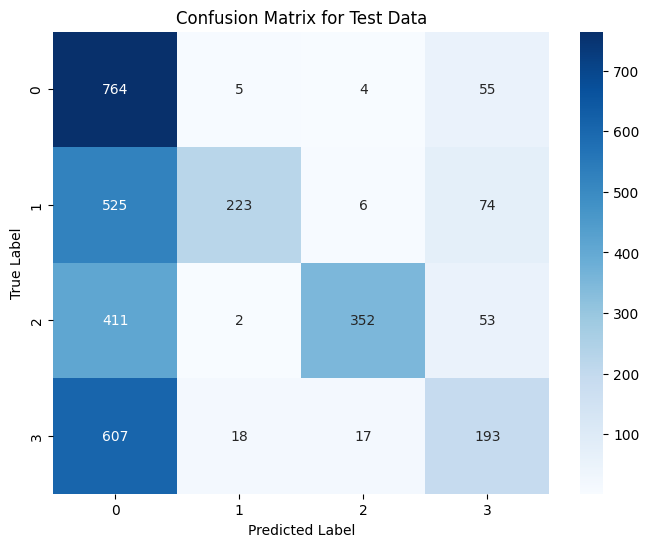

In [ ]:
# Define parameter grid
param_grid = {
    'max_depth': list(range(1, 31))  # try depths from 1 to 30
}

# Create model
tree_clf = DecisionTreeClassifier(random_state=42)

# Create grid search with cross-validation
grid_search = GridSearchCV(
    tree_clf,
    param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='accuracy',  # or 'f1_macro', etc.
    n_jobs=-1,  # use all CPU cores
    verbose=1
)

# Fit search
grid_search.fit(X_train, y_train)

# Best depth
print("Best max_depth:", grid_search.best_params_['max_depth'])
print("Best cross-validated score:", grid_search.best_score_)

# Best model
best_tree = grid_search.best_estimator_

# Evaluate on test set
print_score(best_tree, X_train, y_train, X_test, y_test, train=True)
print_score(best_tree, X_train, y_train, X_test, y_test, train=False)


Mean CV Accuracy: 0.47008107565196655
Train Result:
Accuracy Score: 50.60%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.347300     0.995918     0.985185     0.641061  0.506044   
recall        0.959313     0.295578     0.479135     0.287062  0.506044   
f1-score      0.509974     0.455862     0.644718     0.396552  0.506044   
support    3318.000000  3302.000000  3331.000000  3285.000000  0.506044   

              macro avg  weighted avg  
precision      0.742366      0.742550  
recall         0.505272      0.506044  
f1-score       0.501776      0.502235  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[3183    0    3  132]
 [2093  976    2  231]
 [1570    0 1596  165]
 [2319    4   19  943]]

Test Result:
Accuracy Score: 46.30%
_______________________________________________
CLASSIFICATION REPORT:
         

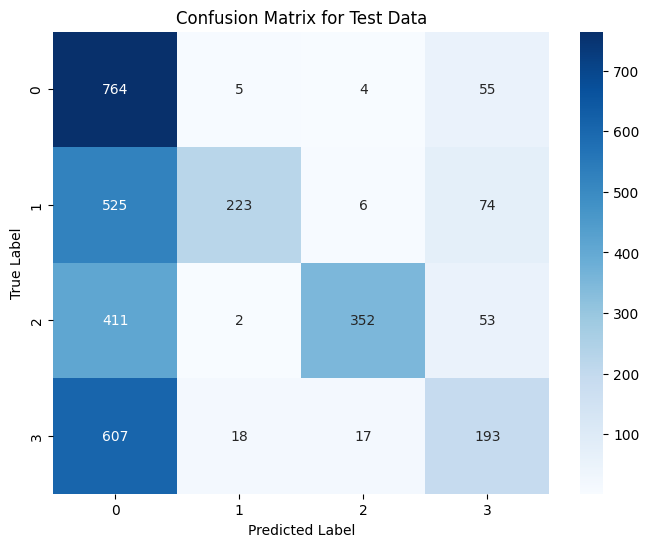

In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

tree_clf = DecisionTreeClassifier(max_depth=30, random_state=42)

# 5-fold cross-validation score
cv_scores = cross_val_score(tree_clf, X_train, y_train, cv=5, scoring='accuracy')

print("Mean CV Accuracy:", np.mean(cv_scores))

# Then train on full data if satisfied
tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)


In [ ]:
tree_clf = DecisionTreeClassifier(max_depth=20, random_state=42)

tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

In [ ]:
# Get the depth of the trained tree
depth = best_tree.get_depth()
print(f"Depth of the decision tree: {depth}")

Depth of the decision tree: 30


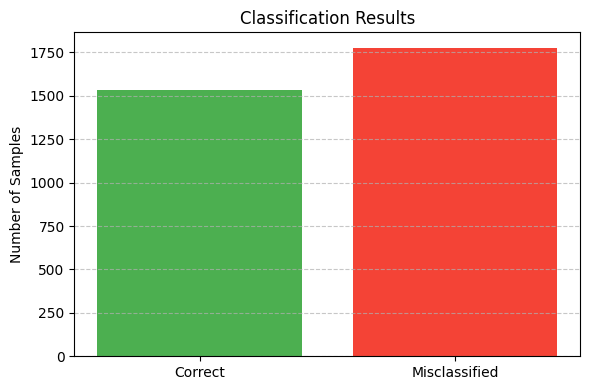


Sample Misclassified Examples per True Label:

Label 0 - Total Misclassified: 64
                                                                                                                                                                               Text  \
2761                                                                         happy cake day well wall layer nicotine fume much hah flick i.d. like smell fourth dimension play game   
3014                                                                     happy cake day well wall layer nicotine bullet much hah picture show id comparable look sentence play game   
17                               need level start conk out gym take forethought hang around high quality people significantly stop think others fit call up act certain affair sure   
2419                                                                    yup feel overly hard punish grounds mistlands ashlands probably enjoyable people beat mountain field peaced   
321

In [ ]:
error_analysis(tree_clf, X_test, y_test, X_test_raw)

In [ ]:
# Create a pipeline for LIME
class_names = ['0', '1', '2', '3']
pipeline = make_pipeline(count_vectorizer, best_tree)

# LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Select an instance to explain
idx = 851
text_instance = X_test_raw.iloc[idx]

# Explain the prediction
lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=1000, labels=[0, 1, 2, 3])

# Show explanation in notebook
lime_exp.show_in_notebook()
# Save as HTML
lime_exp.save_to_file('lime_explanation_BOW_DT.html')


In [ ]:
import numpy as np
import pandas as pd
from collections import Counter
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline

# Make sure to fit your classifier and vectorizer before this step
# Assumes:
# - best_tree is your trained DecisionTreeClassifier
# - tfidf_vectorizer is your fitted TF-IDF vectorizer
# - X_test is your test vector data
# - y_test is the corresponding labels (Pandas Series)
# - X_test_raw is the raw text for the test set (Pandas Series)

# Setup pipeline for LIME
class_names = sorted(y_test.unique().astype(str))
pipeline = make_pipeline(count_vectorizer, best_tree)

# Initialize LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Get misclassified sample indices
misclassified_idxs = np.where(y_test.to_numpy() != best_tree.predict(X_test))[0]

# Limit to avoid long computation
misclassified_idxs = misclassified_idxs[:50]

# Track most common features
feature_counter = Counter()

print(f"Analyzing {len(misclassified_idxs)} misclassified samples...\n")

for idx in misclassified_idxs:
    text_instance = X_test_raw.iloc[idx]

    # Skip empty or non-string texts
    if not isinstance(text_instance, str) or len(text_instance.strip()) == 0:
        continue

    try:
        lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=20)
        for feature, weight in lime_exp.as_list():
            feature_counter[feature] += 1
    except Exception as e:
        print(f"Skipping index {idx} due to error: {e}")
        continue

# Display most common influential features
print("Most common influential features in misclassified samples:")
for feature, count in feature_counter.most_common(20):
    print(f"{feature}: {count} times")


Analyzing 50 misclassified samples...

Most common influential features in misclassified samples:
thats: 5 times
people: 3 times
say: 3 times
take: 3 times
year: 3 times
go: 3 times
could: 2 times
much: 2 times
society: 2 times
one: 2 times
use: 2 times
right: 2 times
called: 2 times
sure: 2 times
up: 2 times
around: 2 times
call: 2 times
certain: 2 times
place: 2 times
way: 2 times


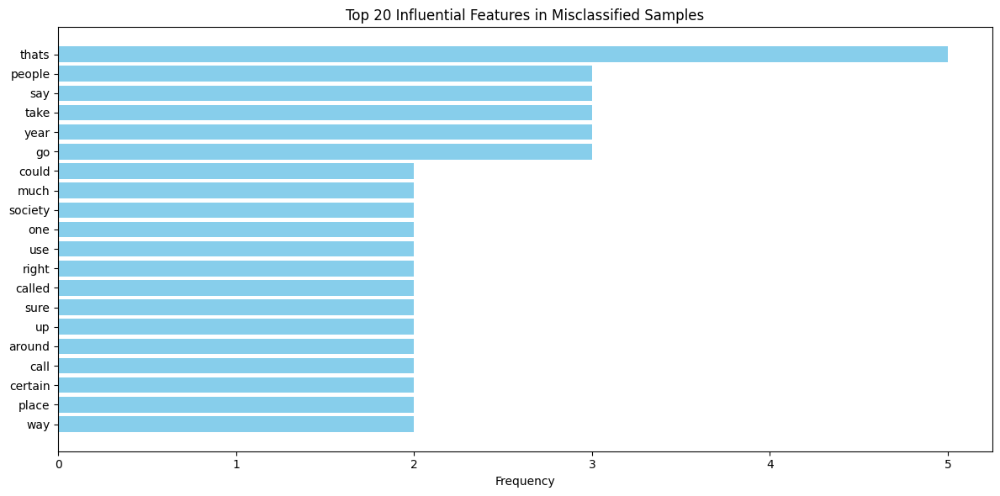

In [ ]:
# Get the top N features to plot
top_n = 20
top_features = feature_counter.most_common(top_n)

if top_features:
    features, counts = zip(*top_features)

    plt.figure(figsize=(12, 6))
    plt.barh(features, counts, color='skyblue')
    plt.gca().invert_yaxis()  # Highest count at the top
    plt.xlabel("Frequency")
    plt.title(f"Top {top_n} Influential Features in Misclassified Samples")
    plt.tight_layout()
    plt.show()
else:
    print("No influential features to plot.")


In [ ]:
from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(
    best_tree,
    out_file=None,
    feature_names=tfidf_vectorizer.get_feature_names_out(),
    class_names=[str(cls) for cls in best_tree.classes_],
    filled=True,
    rounded=True,
    special_characters=True,
)

graph = graphviz.Source(dot_data)
graph.render("tree_BOW_DT", format="png", cleanup=False)  # saves as tree.png


'tree_BOW_DT.png'

In [ ]:
test_score = accuracy_score(y_test, best_tree.predict(X_test)) * 100
train_score = accuracy_score(y_train, best_tree.predict(X_train)) * 100

results_df = pd.DataFrame(data=[["Decision Tree Classifier", train_score, test_score]], columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df


,Model,Training Accuracy %,Testing Accuracy %
0,Decision Tree Classifier,50.604412,46.297975


### 2. Naive Bayes

Train Result:
Accuracy Score: 88.86%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.873378     0.914442     0.858033     0.917144  0.888561   
recall        0.912598     0.860993     0.950766     0.828919  0.888561   
f1-score      0.892557     0.886913     0.902022     0.870803  0.888561   
support    3318.000000  3302.000000  3331.000000  3285.000000  0.888561   

              macro avg  weighted avg  
precision      0.890749      0.890623  
recall         0.888319      0.888561  
f1-score       0.888074      0.888132  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[3028   65  144   81]
 [ 151 2843  167  141]
 [ 100   40 3167   24]
 [ 188  161  213 2723]]

Test Result:
Accuracy Score: 77.73%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1           2  

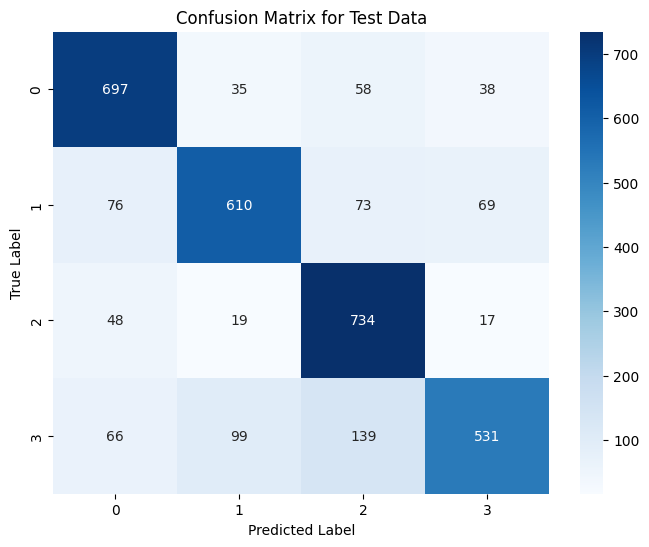

In [ ]:
# Inisialisasi dan latih model Naive Bayes
nb_clf = MultinomialNB()
nb_clf.fit(X_train, y_train)

# Evaluasi model Naive Bayes
print_score(nb_clf, X_train, y_train, X_test, y_test, train=True)
print_score(nb_clf, X_train, y_train, X_test, y_test, train=False)

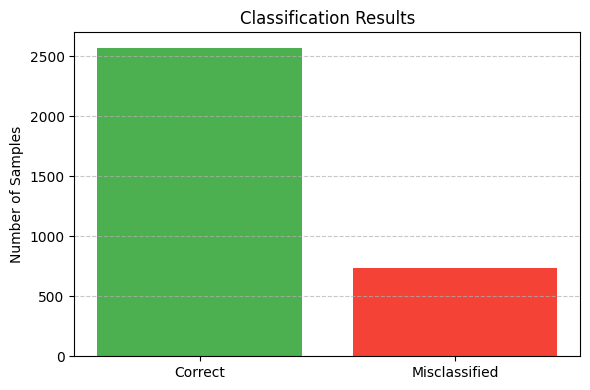


Sample Misclassified Examples per True Label:

Label 0 - Total Misclassified: 131
                                                                      Text  \
1352                                                       social movement   
943   yeah youre right know trillion dollar company netflix need hire note   
510                                                  yeah acknowledge meme   
714                                                            damn proper   
2734   whats crazy far year ago would top musician arent cool anymore haha   
1363                                                                  dada   
1733                                        saw accurate post hour ago bro   
2531                                                         green goddess   
2015                                                alright bet mean value   
595                                        tending reddit none crap matter   

      Predicted Label  
1352                3  
943       

In [ ]:
error_analysis(nb_clf, X_test, y_test, X_test_raw)

In [ ]:
# Create a pipeline for LIME
class_names = ['0', '1', '2', '3']
pipeline = make_pipeline(count_vectorizer, nb_clf)

# LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Select an instance to explain
idx = 2911
text_instance = X_test_raw.iloc[idx]

# Explain the prediction
lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=1000, labels=[0, 1, 2, 3])

# Show explanation in notebook
lime_exp.show_in_notebook()
# Save as HTML
lime_exp.save_to_file('lime_explanation_BOW_NB.html')


In [ ]:
import numpy as np
import pandas as pd
from collections import Counter
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline

# Make sure to fit your classifier and vectorizer before this step
# Assumes:
# - best_tree is your trained DecisionTreeClassifier
# - tfidf_vectorizer is your fitted TF-IDF vectorizer
# - X_test is your test vector data
# - y_test is the corresponding labels (Pandas Series)
# - X_test_raw is the raw text for the test set (Pandas Series)

# Setup pipeline for LIME
class_names = sorted(y_test.unique().astype(str))
pipeline = make_pipeline(count_vectorizer, nb_clf)

# Initialize LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Get misclassified sample indices
misclassified_idxs = np.where(y_test.to_numpy() != nb_clf.predict(X_test))[0]

# Limit to avoid long computation
misclassified_idxs = misclassified_idxs[:50]

# Track most common features
feature_counter = Counter()

print(f"Analyzing {len(misclassified_idxs)} misclassified samples...\n")

for idx in misclassified_idxs:
    text_instance = X_test_raw.iloc[idx]

    # Skip empty or non-string texts
    if not isinstance(text_instance, str) or len(text_instance.strip()) == 0:
        continue

    try:
        lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=20)
        for feature, weight in lime_exp.as_list():
            feature_counter[feature] += 1
    except Exception as e:
        print(f"Skipping index {idx} due to error: {e}")
        continue

# Display most common influential features
print("Most common influential features in misclassified samples:")
for feature, count in feature_counter.most_common(20):
    print(f"{feature}: {count} times")


Analyzing 50 misclassified samples...

Most common influential features in misclassified samples:
could: 3 times
know: 3 times
time: 3 times
kid: 3 times
youre: 3 times
need: 3 times
live: 2 times
thinking: 2 times
house: 2 times
woman: 2 times
lot: 2 times
make: 2 times
would: 2 times
anything: 2 times
right: 2 times
think: 2 times
people: 2 times
take: 2 times
thing: 2 times
used: 2 times


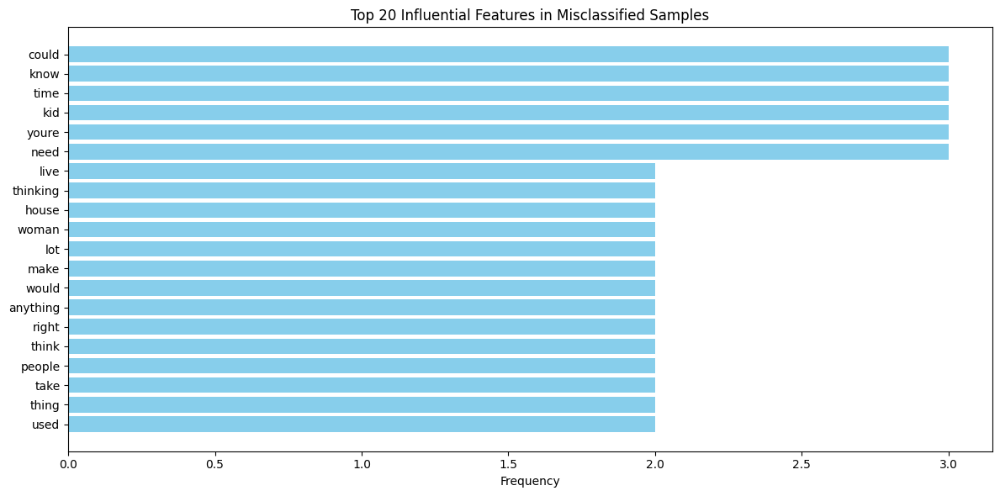

In [ ]:
# Get the top N features to plot
top_n = 20
top_features = feature_counter.most_common(top_n)

if top_features:
    features, counts = zip(*top_features)

    plt.figure(figsize=(12, 6))
    plt.barh(features, counts, color='skyblue')
    plt.gca().invert_yaxis()  # Highest count at the top
    plt.xlabel("Frequency")
    plt.title(f"Top {top_n} Influential Features in Misclassified Samples")
    plt.tight_layout()
    plt.show()
else:
    print("No influential features to plot.")


In [ ]:
# Hitung akurasi untuk train dan test
nb_test_score = accuracy_score(y_test, nb_clf.predict(X_test)) * 100
nb_train_score = accuracy_score(y_train, nb_clf.predict(X_train)) * 100

# Simpan hasil ke dalam DataFrame
results_df_nb = pd.DataFrame(data=[["Naive Bayes", nb_train_score, nb_test_score]],
                             columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])

results_df = pd.concat([results_df, results_df_nb], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Decision Tree Classifier,50.604412,46.297975
1,Naive Bayes,88.856150,77.727410


## Fasttext

In [ ]:
import fasttext.util
fasttext.util.download_model('en', if_exists='ignore')  # English
ft = fasttext.load_model('cc.en.300.bin')

In [ ]:
!cp cc.en.300.bin "/content/drive/MyDrive/[2] University/Semester 6/NLP/"

In [ ]:
!cp cc.en.300.bin.gz "/content/drive/MyDrive/[2] University/Semester 6/NLP/"

In [ ]:
# Load pretrained FastText vectors in .vec format with gensim
ft = fasttext.load_model('/content/drive/MyDrive/[2] University/Semester 6/NLP/cc.en.300.bin')
# ft = KeyedVectors.load_word2vec_format('/content/drive/MyDrive/[2] University/Semester 6/NLP/wiki-news-300d-1M.vec', binary=False)

def document_to_fasttext_vector(text, model, embedding_dim=300):
    tokens = text.split()
    valid_vectors = []
    for token in tokens:
        if token in model:
            valid_vectors.append(model[token])
    if valid_vectors:
        return np.mean(valid_vectors, axis=0)
    else:
        return np.zeros(embedding_dim)

# Prepare dataset
df = df.dropna(subset=['processed_text', 'Category_Label'])

X_raw = df['processed_text']
y = df['Category_Label']

X_vectors = np.array([document_to_fasttext_vector(text, ft) for text in X_raw])

X_train, X_test, y_train, y_test = train_test_split(X_vectors, y, test_size=0.2, random_state=42)


In [ ]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
# ---------------------------
# Ensure no missing values
# ---------------------------
df = df.dropna(subset=['processed_text', 'Category_Label'])

# ---------------------------
# Tokenize text
# ---------------------------
df['tokens'] = df['processed_text'].apply(word_tokenize)

# ---------------------------
# Train-test split BEFORE FastText training
# ---------------------------
X_tokens_train, X_tokens_test, y_train, y_test = train_test_split(
    df['tokens'], df['Category_Label'], test_size=0.2, random_state=42
)

# ---------------------------
# Train FastText on training tokens
# ---------------------------
fasttext_model = FastText(sentences=X_tokens_train, vector_size=100, window=5, min_count=1, workers=4, sg=1)

# ---------------------------
# Function to average FastText vectors
# ---------------------------
def document_vector(doc):
    doc = [word for word in doc if word in fasttext_model.wv.key_to_index]
    if not doc:
        return np.zeros(fasttext_model.vector_size)
    return np.mean([fasttext_model.wv[word] for word in doc], axis=0)

# ---------------------------
# Create document vectors
# ---------------------------
X_train = np.array([document_vector(doc) for doc in X_tokens_train])
X_test = np.array([document_vector(doc) for doc in X_tokens_test])


### 1. Decision Tree Classifier

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best max_depth: 29
Best cross-validated score: 0.489800886142552
Train Result:
Accuracy Score: 99.43%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.995156     0.983562     0.999397     0.999082  0.994258   
recall        0.990657     0.996669     0.995497     0.994216  0.994258   
f1-score      0.992901     0.990072     0.997443     0.996643  0.994258   
support    3318.000000  3302.000000  3331.000000  3285.000000  0.994258   

              macro avg  weighted avg  
precision      0.994299      0.994306  
recall         0.994260      0.994258  
f1-score       0.994265      0.994267  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[3287   30    1    0]
 [   8 3291    1    2]
 [   2   12 3316    1]
 [   6   13    0 3266]]

Test Result:
Accuracy Score

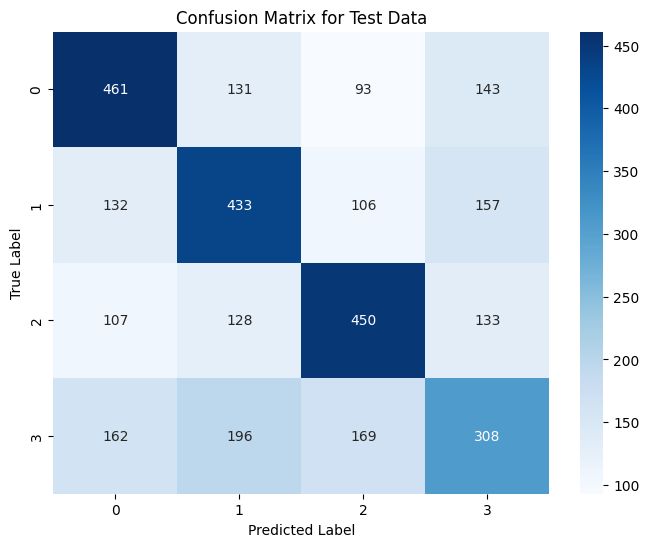

In [ ]:
# Define parameter grid
param_grid = {
    'max_depth': list(range(1, 31))  # try depths from 1 to 30
}

# Create model
tree_clf = DecisionTreeClassifier(random_state=42)

# Create grid search with cross-validation
grid_search = GridSearchCV(
    tree_clf,
    param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='accuracy',  # or 'f1_macro', etc.
    n_jobs=-1,  # use all CPU cores
    verbose=1
)

# Fit search
grid_search.fit(X_train, y_train)

# Best depth
print("Best max_depth:", grid_search.best_params_['max_depth'])
print("Best cross-validated score:", grid_search.best_score_)

# Best model
best_tree = grid_search.best_estimator_

# Evaluate on test set
print_score(best_tree, X_train, y_train, X_test, y_test, train=True)
print_score(best_tree, X_train, y_train, X_test, y_test, train=False)


Mean CV Accuracy: 0.49274801776393956
Train Result:
Accuracy Score: 99.50%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.995763     0.985924     0.998796     0.999694  0.995014   
recall        0.991561     0.996972     0.996097     0.995434  0.995014   
f1-score      0.993658     0.991417     0.997445     0.997559  0.995014   
support    3318.000000  3302.000000  3331.000000  3285.000000  0.995014   

              macro avg  weighted avg  
precision      0.995044      0.995047  
recall         0.995016      0.995014  
f1-score       0.995020      0.995020  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[3290   26    2    0]
 [   8 3292    1    1]
 [   2   11 3318    0]
 [   4   10    1 3270]]

Test Result:
Accuracy Score: 49.77%
_______________________________________________
CLASSIFICATION REPORT:
         

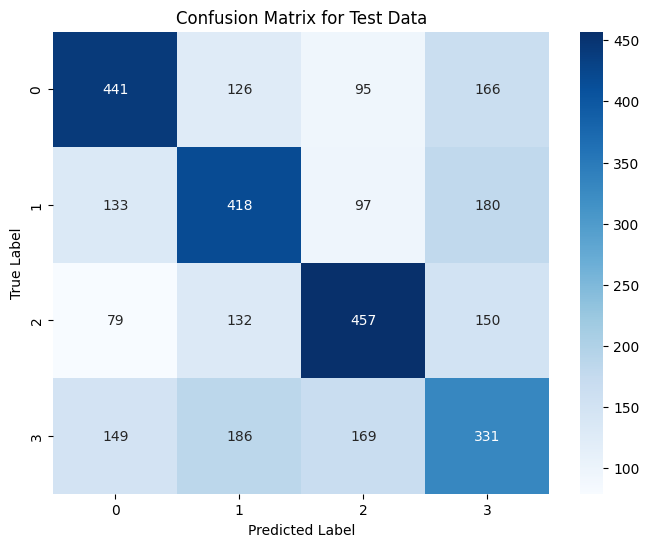

In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

tree_clf = DecisionTreeClassifier(max_depth=30, random_state=42)

# 5-fold cross-validation score
cv_scores = cross_val_score(tree_clf, X_train, y_train, cv=5, scoring='accuracy')

print("Mean CV Accuracy:", np.mean(cv_scores))

# Then train on full data if satisfied
tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)


Train Result:
Accuracy Score: 99.52%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.996065     0.985928     0.999398     0.999694   0.99524   
recall        0.991863     0.997274     0.996097     0.995738   0.99524   
f1-score      0.993960     0.991569     0.997745     0.997712   0.99524   
support    3318.000000  3302.000000  3331.000000  3285.000000   0.99524   

              macro avg  weighted avg  
precision      0.995271      0.995276  
recall         0.995243      0.995240  
f1-score       0.995246      0.995247  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[3291   26    1    0]
 [   7 3293    1    1]
 [   2   11 3318    0]
 [   4   10    0 3271]]

Test Result:
Accuracy Score: 49.68%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1           2  

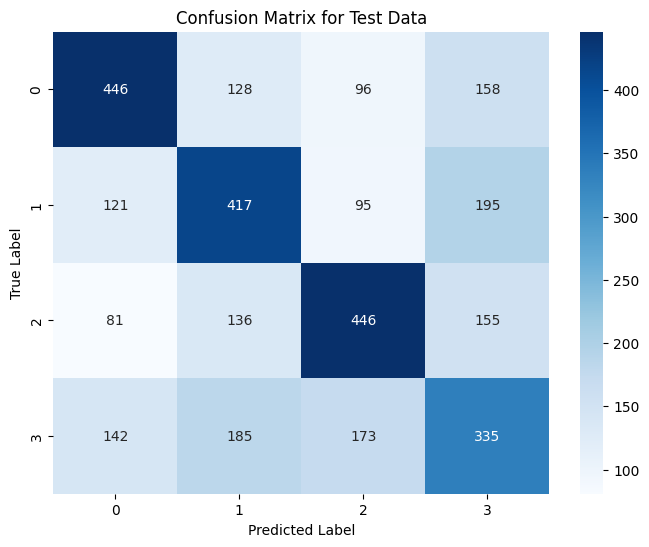

In [ ]:
from sklearn.tree import DecisionTreeClassifier

tree_clf = DecisionTreeClassifier(random_state=42)

tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

In [ ]:
# Get the depth of the trained tree
depth = tree_clf.get_depth()
print(f"Depth of the decision tree: {depth}")

Depth of the decision tree: 32


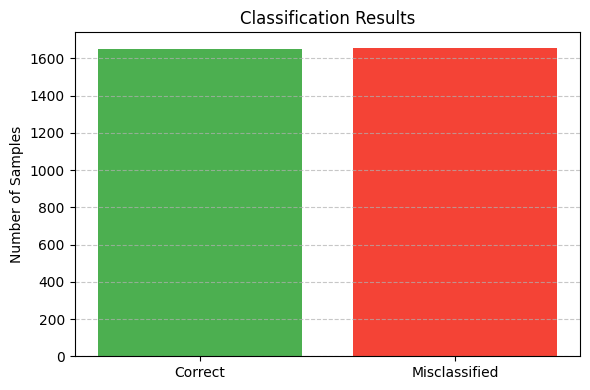


Sample Misclassified Examples per True Label:

Label 0 - Total Misclassified: 367
                                                                                                                                                                                               Text  \
1786                                                                                                                                         unpopular opinion much twice chill obnoxious perdition   
322                                                                                                                                                                                            head   
155   last meter son dental check bring harry potter leger register waiting elbow room dentist started talking harry potter theme car park cute son popped cant afford go right hand mom shit broke   
2782                                                                                                                     

In [ ]:
# Make sure you have raw test text saved (before tokenizing or vectorizing)
X_test_raw = X_tokens_test.apply(lambda tokens: ' '.join(tokens))

# Run error analysis
error_analysis(tree_clf, X_test, y_test, X_test_raw)

In [ ]:
from lime.lime_text import LimeTextExplainer

# Define class names
class_names = ['0', '1', '2', '3']

# LIME explainer
lime_explainer = LimeTextExplainer(class_names=class_names)

# Function that vectorizes text using FastText and predicts
def predict_proba_fasttext(texts):
    vectors = []
    for text in texts:
        tokens = word_tokenize(text.lower())  # Tokenize like you did during training
        vec = document_vector(tokens)
        vectors.append(vec)
    return best_tree.predict_proba(np.array(vectors))

# Choose text instance
idx = 2581
text_instance = X_test_raw.iloc[idx]

# Explain prediction
lime_exp = lime_explainer.explain_instance(
    text_instance,
    predict_proba_fasttext,
    num_features=20,
    labels=[0, 1, 2, 3]
)

# Show in notebook
lime_exp.show_in_notebook()

# Save to HTML
lime_exp.save_to_file('lime_explanation_FASTTEXT_DT.html')


In [ ]:
import numpy as np
import pandas as pd
from collections import Counter
from lime.lime_text import LimeTextExplainer
from nltk.tokenize import word_tokenize

# Ensure you have:
# - best_tree: your trained classifier
# - fasttext_model: trained FastText model
# - X_test_raw: raw text (Series)
# - y_test: true labels (Series)
# - document_vector(): function that converts token list into vector

# LIME explainer setup
class_names = sorted(y_test.unique().astype(str))
lime_explainer = LimeTextExplainer(class_names=class_names)

# Custom predict_proba function for LIME
def predict_proba_fasttext(texts):
    vectors = []
    for text in texts:
        tokens = word_tokenize(text.lower())  # same preprocessing used in training
        vec = document_vector(tokens)
        vectors.append(vec)
    return best_tree.predict_proba(np.array(vectors))

# Get misclassified indices
misclassified_idxs = np.where(y_test.to_numpy() != best_tree.predict(X_test))[0]

# Limit to avoid long computation
misclassified_idxs = misclassified_idxs[:50]

# Track most common features
feature_counter = Counter()

print(f"Analyzing {len(misclassified_idxs)} misclassified samples...\n")

for idx in misclassified_idxs:
    text_instance = X_test_raw.iloc[idx]

    if not isinstance(text_instance, str) or len(text_instance.strip()) == 0:
        continue

    try:
        lime_exp = lime_explainer.explain_instance(
            text_instance,
            predict_proba_fasttext,
            num_features=20
        )
        for feature, weight in lime_exp.as_list():
            feature_counter[feature] += 1
    except Exception as e:
        print(f"Skipping index {idx} due to error: {e}")
        continue

# Display most common influential features
print("Most common influential features in misclassified samples:")
for feature, count in feature_counter.most_common(20):
    print(f"{feature}: {count} times")


Analyzing 50 misclassified samples...

Most common influential features in misclassified samples:
thats: 6 times
people: 6 times
get: 6 times
think: 4 times
could: 3 times
take: 3 times
know: 3 times
watch: 3 times
yes: 3 times
cant: 3 times
go: 3 times
sure: 3 times
stop: 3 times
certain: 3 times
shit: 3 times
would: 3 times
day: 3 times
man: 3 times
time: 3 times
lol: 3 times


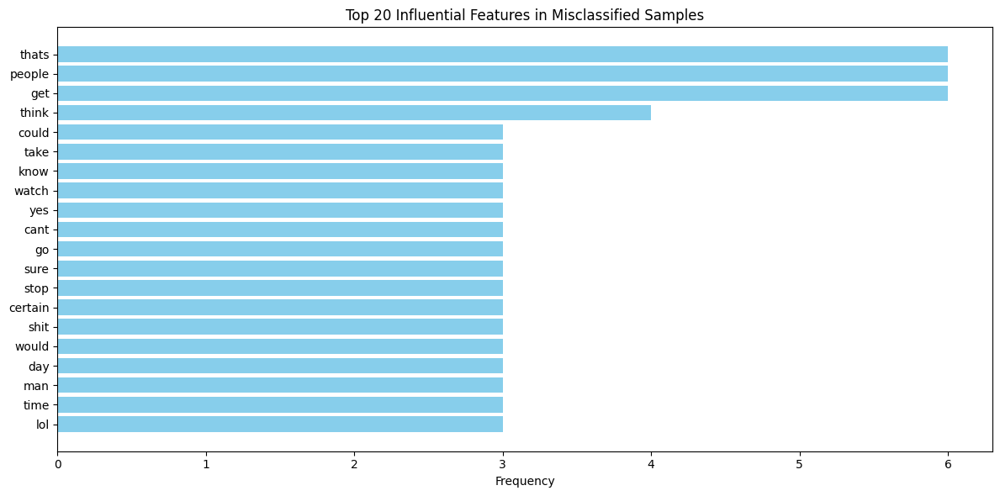

In [ ]:
# Get the top N features to plot
top_n = 20
top_features = feature_counter.most_common(top_n)

if top_features:
    features, counts = zip(*top_features)

    plt.figure(figsize=(12, 6))
    plt.barh(features, counts, color='skyblue')
    plt.gca().invert_yaxis()  # Highest count at the top
    plt.xlabel("Frequency")
    plt.title(f"Top {top_n} Influential Features in Misclassified Samples")
    plt.tight_layout()
    plt.show()
else:
    print("No influential features to plot.")


In [ ]:
from sklearn.tree import export_graphviz
import graphviz

# Use generic names for FastText vector dimensions
feature_names = [f"f{i}" for i in range(X_train.shape[1])]

dot_data = export_graphviz(
    tree_clf,
    out_file=None,
    feature_names=feature_names,
    class_names=[str(cls) for cls in tree_clf.classes_],
    filled=True,
    rounded=True,
    special_characters=True,
)

graph = graphviz.Source(dot_data)
graph.render("tree_FASTTEXT_DT", format="png", cleanup=False)  # saves as tree_FASTTEXT_DT.png
# graph.render("tree_FASTTEXT_DT", format="svg", cleanup=False)
# graph.render("tree_FASTTEXT_DT", format="png", cleanup=False, renderer='cairo')


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.183523 to fit


'tree_FASTTEXT_DT.png'

In [ ]:
test_score = accuracy_score(y_test, tree_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, tree_clf.predict(X_train)) * 100

results_df = pd.DataFrame(data=[["Decision Tree Classifier", train_score, test_score]], columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Decision Tree Classifier,98.76851,51.949229


### 2. Naive Bayes

Train Result:
Accuracy Score: 34.47%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2            3  accuracy  \
precision     0.364512     0.409602     0.322778     0.345217  0.344666   
recall        0.159735     0.165354     0.523266     0.530594  0.344666   
f1-score      0.222129     0.235599     0.399267     0.418287  0.344666   
support    3318.000000  3302.000000  3331.000000  3285.000000  0.344666   

              macro avg  weighted avg  
precision      0.360527      0.360469  
recall         0.344737      0.344666  
f1-score       0.318820      0.318752  
support    13236.000000  13236.000000  
_______________________________________________
Confusion Matrix: 
 [[ 530  394 1325 1069]
 [ 322  546 1275 1159]
 [ 305  205 1743 1078]
 [ 297  188 1057 1743]]

Test Result:
Accuracy Score: 34.72%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1           2  

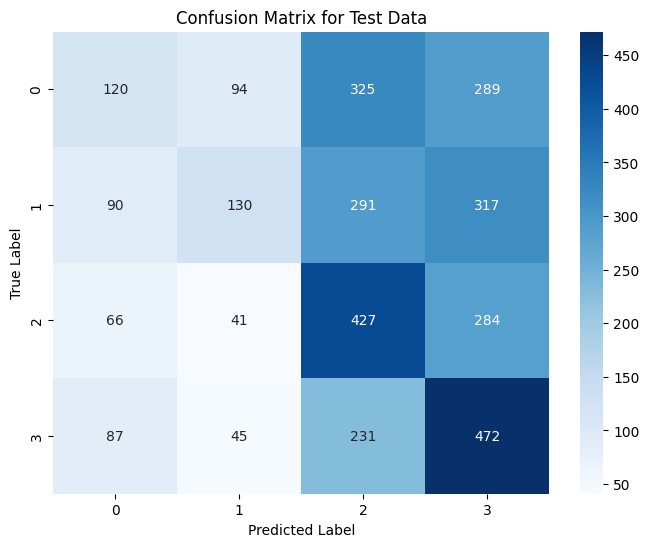

In [ ]:
from sklearn.naive_bayes import GaussianNB

# Initialize Gaussian Naive Bayes
gnb_clf = GaussianNB()

# Train model
gnb_clf.fit(X_train, y_train)

# Evaluate
print_score(gnb_clf, X_train, y_train, X_test, y_test, train=True)
print_score(gnb_clf, X_train, y_train, X_test, y_test, train=False)

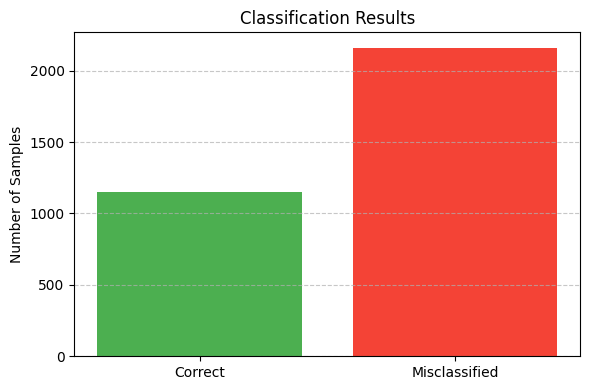


Sample Misclassified Examples per True Label:

Label 0 - Total Misclassified: 708
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              Text  \
553                                                                                                                                                                                                                                                                                            

In [ ]:
X_test_raw = X_tokens_test.apply(lambda tokens: ' '.join(tokens))


error_analysis(gnb_clf, X_test, y_test, X_test_raw)

In [ ]:
# Create a pipeline for LIME
class_names = ['0', '1', '2', '3']
pipeline = make_pipeline(count_vectorizer, nb_clf)

# LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Select an instance to explain
idx = 2911
text_instance = X_test_raw.iloc[idx]

# Explain the prediction
lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=1000, labels=[0, 1, 2, 3])

# Show explanation in notebook
lime_exp.show_in_notebook()
# Save as HTML
lime_exp.save_to_file('lime_explanation_BOW_NB.html')


In [ ]:
import numpy as np
import pandas as pd
from collections import Counter
import lime
import lime.lime_text
from sklearn.pipeline import make_pipeline

# Make sure to fit your classifier and vectorizer before this step
# Assumes:
# - best_tree is your trained DecisionTreeClassifier
# - tfidf_vectorizer is your fitted TF-IDF vectorizer
# - X_test is your test vector data
# - y_test is the corresponding labels (Pandas Series)
# - X_test_raw is the raw text for the test set (Pandas Series)

# Setup pipeline for LIME
class_names = sorted(y_test.unique().astype(str))
pipeline = make_pipeline(count_vectorizer, nb_clf)

# Initialize LIME text explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Get misclassified sample indices
misclassified_idxs = np.where(y_test.to_numpy() != nb_clf.predict(X_test))[0]

# Limit to avoid long computation
misclassified_idxs = misclassified_idxs[:50]

# Track most common features
feature_counter = Counter()

print(f"Analyzing {len(misclassified_idxs)} misclassified samples...\n")

for idx in misclassified_idxs:
    text_instance = X_test_raw.iloc[idx]

    # Skip empty or non-string texts
    if not isinstance(text_instance, str) or len(text_instance.strip()) == 0:
        continue

    try:
        lime_exp = lime_explainer.explain_instance(text_instance, pipeline.predict_proba, num_features=20)
        for feature, weight in lime_exp.as_list():
            feature_counter[feature] += 1
    except Exception as e:
        print(f"Skipping index {idx} due to error: {e}")
        continue

# Display most common influential features
print("Most common influential features in misclassified samples:")
for feature, count in feature_counter.most_common(20):
    print(f"{feature}: {count} times")


Analyzing 50 misclassified samples...

Most common influential features in misclassified samples:
could: 3 times
know: 3 times
time: 3 times
kid: 3 times
youre: 3 times
need: 3 times
live: 2 times
thinking: 2 times
house: 2 times
woman: 2 times
lot: 2 times
make: 2 times
would: 2 times
anything: 2 times
right: 2 times
think: 2 times
people: 2 times
take: 2 times
thing: 2 times
used: 2 times


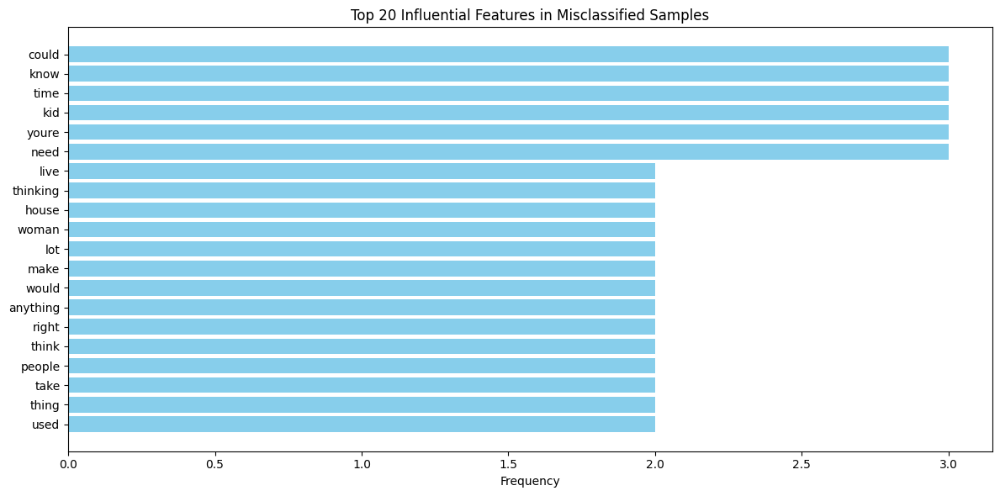

In [ ]:
# Get the top N features to plot
top_n = 20
top_features = feature_counter.most_common(top_n)

if top_features:
    features, counts = zip(*top_features)

    plt.figure(figsize=(12, 6))
    plt.barh(features, counts, color='skyblue')
    plt.gca().invert_yaxis()  # Highest count at the top
    plt.xlabel("Frequency")
    plt.title(f"Top {top_n} Influential Features in Misclassified Samples")
    plt.tight_layout()
    plt.show()
else:
    print("No influential features to plot.")


In [ ]:
# Hitung akurasi untuk train dan test
nb_test_score = accuracy_score(y_test, nb_clf.predict(X_test)) * 100
nb_train_score = accuracy_score(y_train, nb_clf.predict(X_train)) * 100

# Simpan hasil ke dalam DataFrame
results_df_nb = pd.DataFrame(data=[["Naive Bayes", nb_train_score, nb_test_score]],
                             columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])

results_df = pd.concat([results_df, results_df_nb], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Decision Tree Classifier,50.604412,46.297975
1,Naive Bayes,88.856150,77.727410


# Dashboard

In [16]:
!pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 71.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 83.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 7.4 MB/s eta 0:00:00


In [17]:
import streamlit as st
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Function to display evaluation results
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        data = "Train"
    else:
        pred = clf.predict(X_test)
        data = "Test"

    acc = accuracy_score(y_test if not train else y_train, pred)
    report = classification_report(y_test if not train else y_train, pred, output_dict=True)

    st.write(f"### {data} Accuracy: {acc:.4f}")
    st.write(f"### {data} Classification Report")
    st.text(classification_report(y_test if not train else y_train, pred))

    cm = confusion_matrix(y_test if not train else y_train, pred)
    fig, ax = plt.subplots()
    sns.heatmap(cm, annot=True, fmt='d', ax=ax)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_title(f'{data} Confusion Matrix')
    st.pyplot(fig)

# Streamlit app
def main():
    st.title("Naive Bayes Classification Dashboard")

    # Train model on button click
    if st.button("Train Naive Bayes Model"):
        nb_clf = MultinomialNB()
        nb_clf.fit(X_train, y_train)
        st.success("Model trained successfully!")

        # Show train metrics
        print_score(nb_clf, X_train, y_train, X_test, y_test, train=True)
        # Show test metrics
        print_score(nb_clf, X_train, y_train, X_test, y_test, train=False)

        # Optionally, save the model or expose other controls here

if __name__ == "__main__":
    main()


2025-05-24 14:30:14.177 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 14:30:14.288 
  command:

    streamlit run /usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py [ARGUMENTS]
2025-05-24 14:30:14.289 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 14:30:14.290 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 14:30:14.291 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 14:30:14.292 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 14:30:14.292 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-24 14:30:14.293 Thread 'MainThread': mi

In [18]:
streamlit run /usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py

SyntaxError: invalid syntax (<ipython-input-18-fabc432b94c1>, line 1)